# **Chapter 3: Optimization Methods in Image Processing and Computer Vision**

## **1. Classical Least-Squares and Regularized Inverse Problems**
### **1.1 Non-Blind Deblurring**

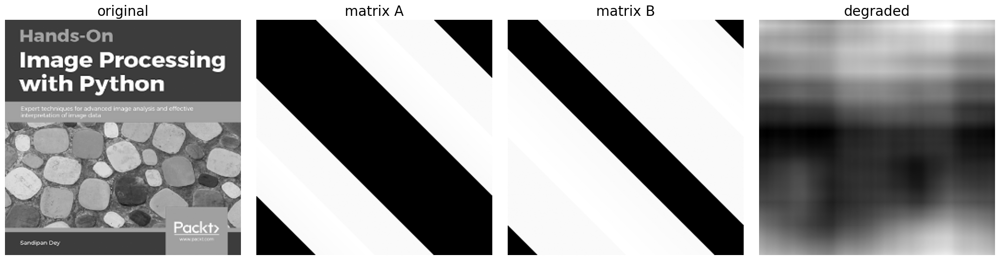

In [2]:
import cv2
from scipy.linalg import circulant, svd
from skimage.metrics import peak_signal_noise_ratio as psnr
import warnings
warnings.filterwarnings('ignore')

F = cv2.imread('images/book.png', 0)
F = cv2.resize(F, (256,256))
# Construct blur matrices A and B using circulant structure
A = circulant([0]*64 + np.logspace(0,1e-3,64).tolist() + list(reversed(np.logspace(0,1e-2,64).tolist())) + [0]*64)
B = circulant([0]*32 + np.logspace(0,1e-2,96).tolist() + list(reversed(np.logspace(0,1e-3,96).tolist())) + [0]*32)
# Generate degraded (blurred + noisy) image
G = B @ F @ A.T + 10*np.random.random(np.prod(F.shape)).reshape(F.shape)
# Visualization of degradation
plt.figure(figsize=(20,5))
plt.gray()
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
plt.subplot(141), plt.imshow(F), plt.axis('off'), plt.title('original', size=20)
plt.subplot(142), plt.imshow(A), plt.axis('off'), plt.title('matrix A', size=20)
plt.subplot(143), plt.imshow(B), plt.axis('off'), plt.title('matrix B', size=20)
plt.subplot(144), plt.imshow(G), plt.axis('off'), plt.title('degraded', size=20)
plt.show()

In [3]:
U_A, S_A, VT_A = svd(A) #, full_matrices=False)
U_B, S_B, VT_B = svd(B) #, full_matrices=False)
# Transform the degraded image into SVD space
G_hat = U_B.T @ G @ U_A
S = np.outer(S_B, S_A)
G_hat.shape, S.shape

((256, 256), (256, 256))

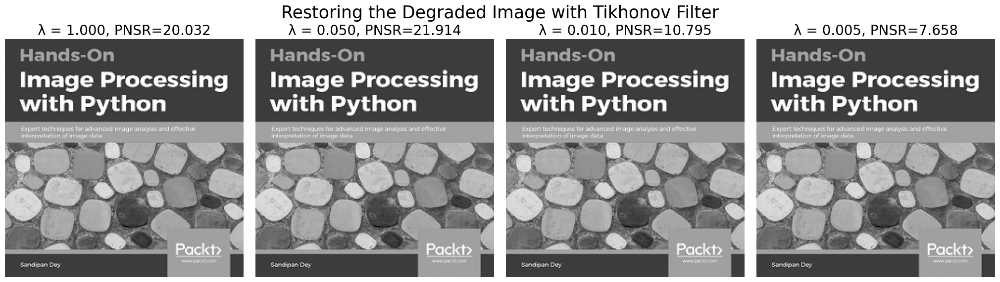

In [4]:
λs = [1, .05, .01, .005]

plt.figure(figsize=(20,6))
plt.gray()
plt.subplots_adjust(0,0,1,0.925,0.05,0.05)
i = 1
for λ in λs:
    F_hat = (S*G_hat) / (S*S+λ**2)
    F_hat = VT_B.T @ F_hat @ VT_A
    plt.subplot(1,4,i), plt.imshow(F), plt.axis('off')
    plt.title('λ = {:.03f}, PNSR={:.03f}'.format(λ, psnr(F, F_hat)), size=20)
    i += 1
plt.suptitle('Restoring the Degraded Image with Tikhonov Filter', size=25)
plt.show()

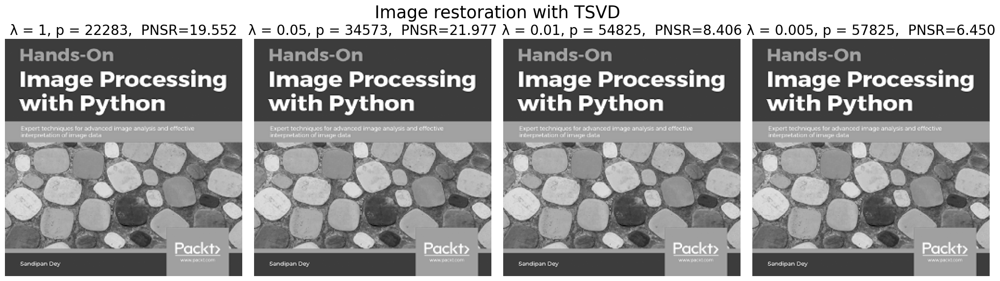

In [5]:
plt.figure(figsize=(20,6))
plt.gray()
plt.subplots_adjust(0,0,1,0.925,0.05,0.05)
i = 1
F_hat = G_hat / (S + 1e-10)
for λ in λs:
    ind = S > λ
    F_new = F_hat * ind
    F_new = VT_B.T @ F_new @ VT_A
    plt.subplot(1,4,i), plt.imshow(F), plt.axis('off')
    plt.title(f'λ = {λ}, p = {np.sum(ind)}, ' + ' PNSR={:.03f}'.format(psnr(F, F_new)), size=20)
    i += 1
plt.suptitle('Image restoration with TSVD', size=25)
plt.show()

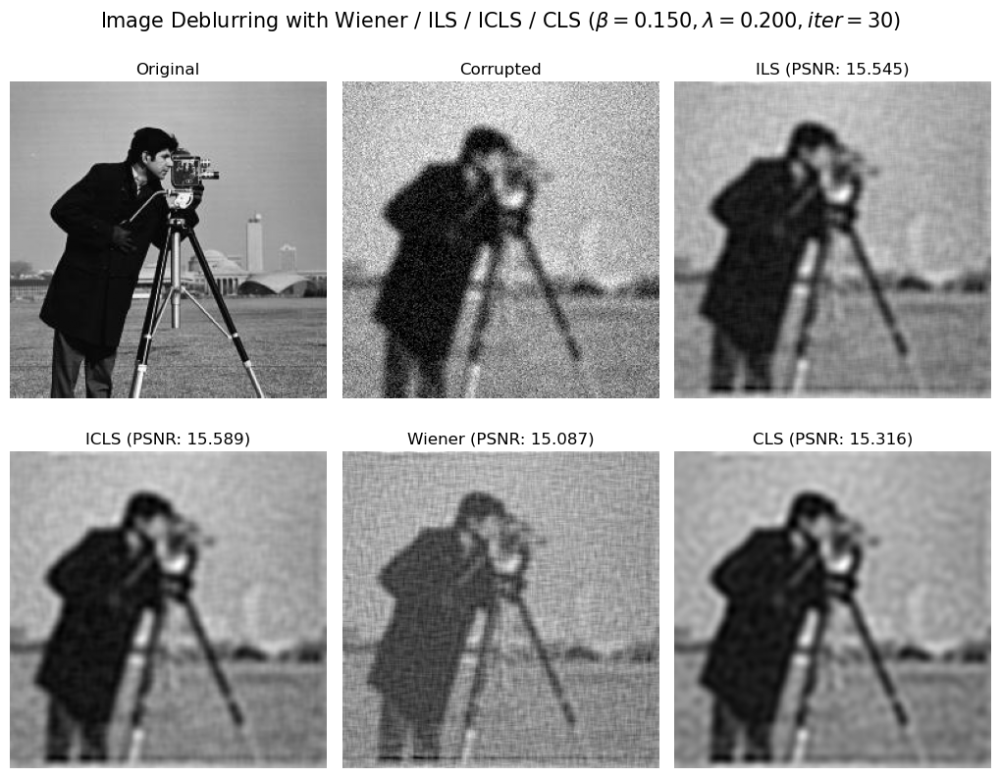

In [44]:
import numpy as np
import cv2
from scipy.signal import convolve2d
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# ---------- Helper: visualization ----------
def plot_images(im, im_blurred, im_ILS_F, im_ICLS_F, im_WLS_F, im_CLS_F, beta, lambd, niter):
    im_ILS  = np.fft.ifft2(im_ILS_F).real
    im_ICLS = np.fft.ifft2(im_ICLS_F).real
    im_WLS  = np.fft.ifft2(im_WLS_F).real
    im_CLS  = np.fft.ifft2(im_CLS_F).real
    plt.figure(figsize=(10, 8))
    plt.gray()
    plt.subplots_adjust(0,0,1,0.9,0.05,0.1)
    plt.subplot(231), plt.imshow(im), plt.axis('off')
    plt.title('Original', size=12)
    plt.subplot(232), plt.imshow(im_blurred), plt.axis('off')
    plt.title('Corrupted', size=12)
    plt.subplot(233), plt.imshow(im_ILS), plt.axis('off')
    plt.title(f'ILS (PSNR: {psnr(im, im_ILS):.3f})', size=12)
    plt.subplot(234), plt.imshow(im_ICLS), plt.axis('off')
    plt.title(f'ICLS (PSNR: {psnr(im, im_ICLS):.3f})', size=12)
    plt.subplot(235), plt.imshow(im_WLS), plt.axis('off')
    plt.title(f'Wiener (PSNR: {psnr(im, im_WLS):.3f})', size=12)
    plt.subplot(236), plt.imshow(im_CLS), plt.axis('off')
    plt.title(f'CLS (PSNR: {psnr(im, im_CLS):.3f})', size=12)
    plt.suptitle(
        'Image Deblurring with Wiener / ILS / ICLS / CLS '
        + rf'$(\beta={beta:.3f}, \lambda={lambd:.3f}, iter={niter})$',
        size=15
    )
    plt.show()

# ---------- Algorithms ----------
def deblur_image_ILS(Y, H, beta, num_iterations):
    """Iterative Least Squares (no regularization)"""
    F = np.zeros_like(Y, dtype=complex)
    for _ in range(num_iterations):
        F = beta * np.conj(H) * Y + (1 - beta * (np.abs(H)**2)) * F
    return F

def deblur_image_ICLS(Y, H, beta, lambd, C, num_iterations):
    """Iterative Constrained Least Squares (with Laplacian regularizer)"""
    F = np.zeros_like(Y, dtype=complex)
    for _ in range(num_iterations):
        F = beta * np.conj(H) * Y + (1 - beta * (np.abs(H)**2 + lambd * (np.abs(C)**2))) * F
    return F

def wiener_filter(Y, H, K=0.01):
    return Y * (np.conj(H) / (np.abs(H)**2 + K))

def cls_filter(Y, H, C, lambd, eps=1e-12):
    """Direct (closed-form) Constrained Least Squares in frequency domain"""
    return Y * (np.conj(H) / (np.abs(H)**2 + lambd * (np.abs(C)**2) + eps))


# ---------- Demo ----------
image = cv2.imread('images/cameraman.png', 0) / 255.0
psf = cv2.getGaussianKernel(9, 5)
kernel = psf @ psf.T
blurred = convolve2d(image, kernel, mode='same', boundary='symm')
blurred = blurred / blurred.max()
noisy = np.clip(blurred + 0.1 * np.random.randn(*blurred.shape), 0, 1)
cor = noisy

'''
image = cv2.imread('images/book.png', 0).astype(float)
image /= image.max()
# Motion blur kernel (vertical line)
k = 7
kernel = np.eye(k) / k
blurred = convolve2d(image, kernel, mode='same', boundary='symm')
blurred /= blurred.max()
noisy = np.clip(blurred + 0.05 * np.random.randn(*blurred.shape), 0, 1)
cor = noisy
'''

# Fourier transforms
Y = np.fft.fft2(cor)
H = np.fft.fft2(kernel, s=image.shape)
laplacian = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
C = np.fft.fft2(laplacian, s=image.shape)

# Parameters
beta, lamd, niter, K = 0.15, 0.5, 30, 0.05

# Deblurring
F_ILS  = deblur_image_ILS(Y, H, beta, niter)
F_ICLS = deblur_image_ICLS(Y, H, beta, lambd, C, niter)
F_CLS  = cls_filter(Y, H, C, lambd=1.5)
F_WLS = wiener_filter(Y, H, K)

# Plot results
plot_images(image, cor, F_ILS, F_ICLS, F_WLS, F_CLS, beta, lambd, niter)

### **1.2 Blind Deblurring / Deconvolution with Richardson-Lucy Algorithm**

In [ ]:
import numpy as np
from scipy.signal import convolve2d, correlate2d
from skimage import io
from skimage.metrics import peak_signal_noise_ratio as psnr
import matplotlib.pyplot as plt

def richardson_lucy_blind(b, f_init, g_init,
                          n_psf_updates=10, n_image_updates=10,
                          eps=1e-8, psf_clip=True, boundary='symm'):
    """
    Annotated Blind Richardson–Lucy (BRL) implementation.

    Returns:
        f : restored image (same shape as b)
        g : estimated PSF (same shape as g_init, sum(g)=1)
    """
    # --- initialization ---------------------------------------------------
    f = f_init.astype(np.float64).copy()             # f <- f^{(0)} (image estimate)
    g = g_init.astype(np.float64).copy()             # g <- g^{(0)} (PSF estimate)
    g = g / (g.sum() + eps)                          # normalize PSF: sum(g)=1

    M, N = f.shape
    ph, pw = g.shape

    # --- outer loop: alternate PSF and image updates ----------------------
    for it in range(n_psf_updates):
        # ---- inner loop: non-blind RL image updates (fix g) -------------
        for k in range(n_image_updates):
            # conv_fg = f * g  (reblurred estimate)
            conv_fg = convolve2d(f, g, mode='same', boundary=boundary)
            # relative = r = b / (f * g + eps)  (pointwise)  -> measures how observed differs from reblurred estimate
            relative = b / (conv_fg + eps)
            # g_flip = g† (flip both axes): required for correlation step
            g_flip = np.flipud(np.fliplr(g))
            # correction = g† * r  implements the RL multiplicative factor for f
            # math: f <- f .* ( g† * ( b / (f*g + eps) ) )
            correction = convolve2d(relative, g_flip, mode='same', boundary=boundary)
            f *= correction
            # multiplicative update preserves positivity: f <- f .* correction
            # numerical safeguard: enforce nonnegativity
            f = np.clip(f, 0, None)

        # ---- PSF update (fix f, update g) --------------------------------
        # conv_fg = f * g  (recompute after f updated)
        conv_fg = convolve2d(f, g, mode='same', boundary=boundary)
        # relative = r = b / (f*g + eps)
        relative = b / (conv_fg + eps)
        # compute full-size cross-correlation between r and f:
        # corr(sx,sy) = sum_x,y r(x,y) * f(x+sx, y+sy)
        # this matrix tells how shifting the PSF (at each shift) matches residuals
        corr = correlate2d(relative, f, mode='same', boundary=boundary)
        # extract the central patch (size equals PSF) -> multiplicative PSF factor
        start_i = (corr.shape[0] - ph) // 2
        start_j = (corr.shape[1] - pw) // 2
        corr_center = corr[start_i:start_i + ph, start_j:start_j + pw]
        # corr_center corresponds to corr evaluated at shifts where PSF support applies
        # multiplicative PSF update:
        # g <- g .* corr_center  (elementwise), analogous to image RL step but on kernel support
        g *= corr_center

        if psf_clip:
            g = np.clip(g, 0, None)  # enforce nonnegativity

        g_sum = g.sum()
        if g_sum <= eps:
            # if PSF collapses (sum ~ 0), reinitialize to uniform small kernel
            g = np.ones_like(g) / (g.size)
        else:
            g /= g_sum           # normalize PSF: sum(g)=1

    return f, g


# load image (grayscale)
im = io.imread('images/book.png', as_gray=True).astype(np.float64)
im = im / im.max()

# true PSF (for simulation)
def gaussian_kernel(size=5, sigma=1.0):
    ax = np.arange(- (size // 2), size // 2 + 1)
    xx, yy = np.meshgrid(ax, ax)
    k = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    return k / k.sum()

np.random.seed(0)
psf_true = gaussian_kernel(5, 1)
blurred = convolve2d(im, psf_true, mode='same', boundary='symm')
noisy = blurred + 0.01 * np.random.randn(*blurred.shape)

# initial guesses
f0 = noisy.copy()
g0 = np.random.rand(*psf_true.shape)
g0 /= g0.sum()
f_rest, g_est = richardson_lucy_blind(noisy, f0, g0, n_psf_updates=10, n_image_updates=10)

# show
fig, ax = plt.subplots(1,4, figsize=(12,3))
ax[0].imshow(im, cmap='gray'); ax[0].set_title('Original'); ax[0].axis('off')
ax[1].imshow(noisy, cmap='gray'); ax[1].set_title('Blurred + Noise'); ax[1].axis('off')
ax[2].imshow(np.clip(f_rest,0,1), cmap='gray'); ax[2].set_title('Restored'); ax[2].axis('off')
ax[3].imshow(g_est / g_est.max(), cmap='gray'); ax[3].set_title('Estimated PSF'); ax[3].axis('off')
plt.tight_layout(); plt.show()

## **2. Iterative Optimization Algorithms in Image Processing**
### **2.1 Gradient Descent and Steepest Descent**

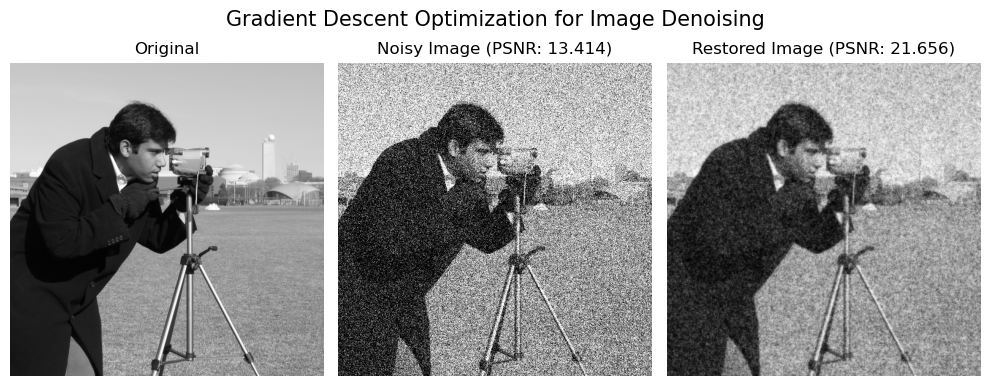

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from scipy.ndimage import laplace
from skimage.metrics import peak_signal_noise_ratio as psnr

# Load and normalize test image
f = img_as_float(data.camera())  # grayscale 512x512 image
f_noisy = f + 0.25 * np.random.randn(*f.shape)
f_noisy = np.clip(f_noisy, 0, 1)

def gradient_descent_denoising(f, lam=0.2, eta=0.1, niter=50):
    """
    Stable gradient descent for quadratic regularized energy:
    E(u) = 0.5||u - f||^2 + 0.5*λ||∇u||^2
    """
    u = f.copy()
    for i in range(niter):
        # Compute Laplacian as smoothness regularizer
        lap = laplace(u)
        grad_E = (u - f) - lam * lap
        u = u - eta * grad_E
    return np.clip(u, 0, 1)

λ = 1
# Stability-aware step size (CFL-like condition)
η = 1.0 / (1.0 + 4.0 * λ)
f_restored = gradient_descent_denoising(f_noisy, lam=λ, eta=η, niter=100)

# Visualization
plt.figure(figsize=(10,4))
plt.subplot(131), plt.imshow(f, cmap='gray'), plt.title('Original', size=12), plt.axis('off')
plt.subplot(132), plt.imshow(f_noisy, cmap='gray'), plt.title(f'Noisy Image (PSNR: {psnr(f, f_noisy):.03f})', size=12), plt.axis('off')
plt.subplot(133), plt.imshow(f_restored, cmap='gray'), plt.title(f'Restored Image (PSNR: {psnr(f, f_restored):.03f})', size=12), plt.axis('off')
plt.suptitle('Gradient Descent Optimization for Image Denoising', size=15)
plt.tight_layout()
plt.show()

### **2.2. Conjugate Gradient Method**

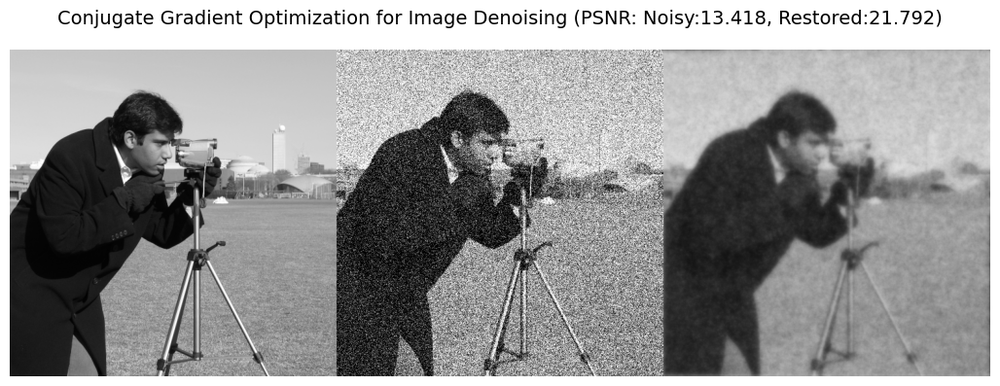

In [39]:
import numpy as np
import cv2

def laplacian(u):
    return (
        -4 * u
        + np.roll(u, 1, axis=0)
        + np.roll(u, -1, axis=0)
        + np.roll(u, 1, axis=1)
        + np.roll(u, -1, axis=1)
    )

def A(u, lam):
    """Linear operator: (I - λΔ)u"""
    return u - lam * laplacian(u)

def conjugate_gradient(f, lam=0.2, max_iter=500, tol=1e-6):
    # Initial guess
    u = f.copy()

    r = f - A(u, lam)          # Residual
    p = r.copy()               # Search direction
    rs_old = np.sum(r * r)

    for _ in range(max_iter):
        Ap = A(p, lam)
        alpha = rs_old / np.sum(p * Ap)

        u = u + alpha * p
        r = r - alpha * Ap

        rs_new = np.sum(r * r)
        if np.sqrt(rs_new) < tol:
            break

        p = r + (rs_new / rs_old) * p
        rs_old = rs_new

    return u

# Load and normalize test image
f = img_as_float(data.camera())  # grayscale 512x512 image
f_noisy = f + 0.25 * np.random.randn(*f.shape)
f_noisy = np.clip(f_noisy, 0, 1)

f_denoised = conjugate_gradient(f_noisy, lam=10)

plt.figure(figsize=(11,4))
plt.gray()
plt.imshow(np.hstack((f, f_noisy, f_denoised))), plt.axis('off')
plt.suptitle(f'Conjugate Gradient Optimization for Image Denoising (PSNR: Noisy:{psnr(f, f_noisy):.03f}, Restored:{psnr(f, f_denoised):.03f})', size=14)
plt.tight_layout()
plt.show()

### **2.3 Newton’s Method**

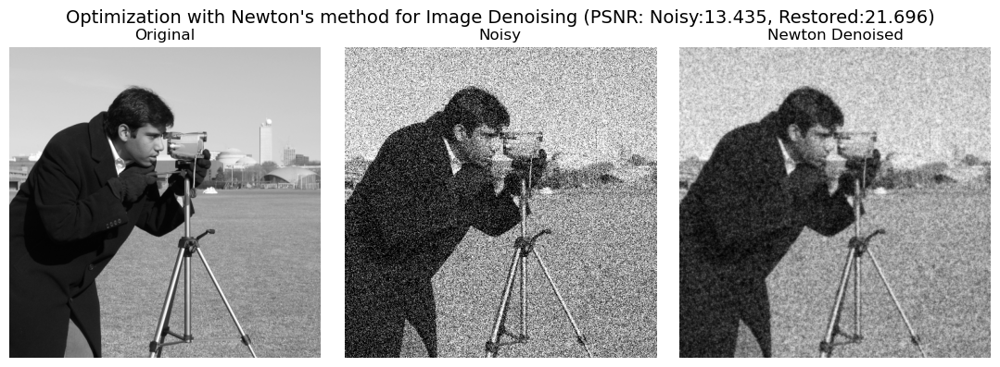

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from scipy.ndimage import laplace
from scipy.sparse.linalg import cg, LinearOperator

# Load image
f = img_as_float(data.camera())
f_noisy = np.clip(f + 0.25 * np.random.randn(*f.shape), 0, 1)

def A(u, lam):
    """Hessian operator: (I - λΔ)u"""
    return u - lam * laplace(u)

def newton_denoising(f, lam=0.1):
    """
    Newton's method for quadratic Tikhonov denoising
    Solves (I - λΔ)u = f
    """
    shape = f.shape
    N = f.size

    # Initial guess
    u = f.copy()

    # Gradient
    grad = (u - f) - lam * laplace(u)

    # Define Hessian as LinearOperator
    def matvec(x):
        x_img = x.reshape(shape)
        y = A(x_img, lam)
        return y.ravel()

    H = LinearOperator((N, N), matvec=matvec)

    # Solve Newton step: H δ = -∇E
    delta, info = cg(H, -grad.ravel(), maxiter=500)

    if info != 0:
        print("Warning: CG did not fully converge")

    u = u + delta.reshape(shape)

    return np.clip(u, 0, 1)

f_newton = newton_denoising(f_noisy, lam=1)

plt.figure(figsize=(11,4))
plt.subplot(131), plt.imshow(f, cmap='gray'), plt.title('Original'), plt.axis('off')
plt.subplot(132), plt.imshow(f_noisy, cmap='gray'), plt.title('Noisy'), plt.axis('off')
plt.subplot(133), plt.imshow(f_newton, cmap='gray'), plt.title('Newton Denoised'), plt.axis('off')
plt.suptitle(f'Optimization with Newton\'s method for Image Denoising (PSNR: Noisy:{psnr(f, f_noisy):.03f}, Restored:{psnr(f, f_newton):.03f})', size=14) 
plt.tight_layout()
plt.show()


### **2.4 Linear Programming Methods for Image Denoising and Total Variation Minimization**

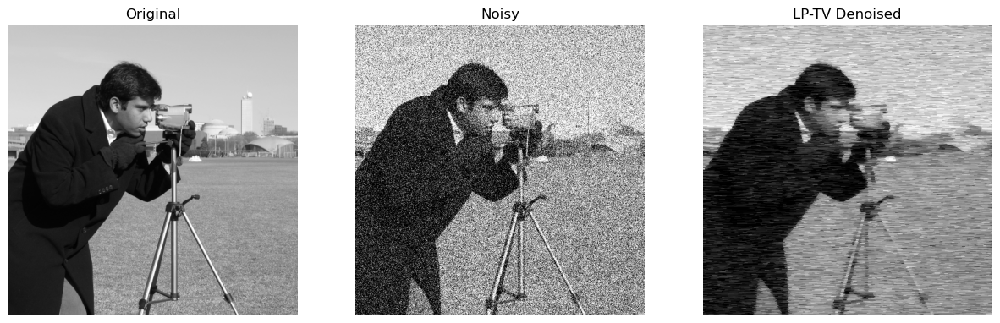

In [16]:
from scipy.optimize import linprog
import numpy as np

def tv_l1_denoise_row(g, lam=0.1):
    n = len(g)
    # Variables: [f | u | v]
    # f: image
    # u: |f - g|
    # v: |Df|
    c = np.hstack([
        np.zeros(n),
        np.ones(n),
        lam * np.ones(n-1)
    ])

    A = []
    b = []

    # |f - g| <= u
    A.append(np.hstack([ np.eye(n), -np.eye(n), np.zeros((n,n-1)) ]))
    b.append(g)
    A.append(np.hstack([-np.eye(n), -np.eye(n), np.zeros((n,n-1)) ]))
    b.append(-g)

    # |f[i+1] - f[i]| <= v
    D = np.eye(n-1, n, k=1) - np.eye(n-1, n)
    A.append(np.hstack([ D, np.zeros((n-1,n)), -np.eye(n-1) ]))
    b.append(np.zeros(n-1))
    A.append(np.hstack([-D, np.zeros((n-1,n)), -np.eye(n-1) ]))
    b.append(np.zeros(n-1))

    A_ub = np.vstack(A)
    b_ub = np.hstack(b)

    bounds = (
        [(None,None)]*n +
        [(0,None)]*n +
        [(0,None)]*(n-1)
    )

    res = linprog(c, A_ub=A_ub, b_ub=b_ub, method="highs")
    return res.x[:n]


from skimage import data, img_as_float
import matplotlib.pyplot as plt

img = img_as_float(data.camera())
noisy = img + 0.25*np.random.randn(*img.shape)
noisy = np.clip(noisy, 0, 1)

denoised = np.zeros_like(noisy)
for i in range(noisy.shape[0]): # for each row in image array
    denoised[i] = tv_l1_denoise_row(noisy[i], lam=2)

plt.figure(figsize=(15,5))
plt.subplot(131), plt.imshow(img, cmap='gray'), plt.title("Original"), plt.axis('off')
plt.subplot(132), plt.imshow(noisy, cmap='gray'), plt.title("Noisy"), plt.axis('off')
plt.subplot(133), plt.imshow(denoised, cmap='gray'), plt.title("LP-TV Denoised"), plt.axis('off')
plt.show()

### **2.5 Total Variation Inpainting via Convex Optimization**

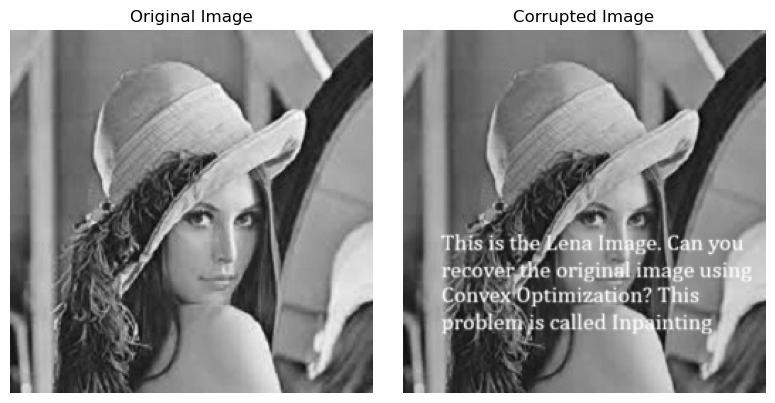

(CVXPY) Jan 09 02:58:38 AM: Your problem has 65536 variables, 65536 constraints, and 0 parameters.
(CVXPY) Jan 09 02:58:38 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jan 09 02:58:38 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jan 09 02:58:38 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jan 09 02:58:38 AM: Your problem is compiled with the CPP canonicalization backend.
(CVXPY) Jan 09 02:58:38 AM: Compiling problem (target solver=SCS).
(CVXPY) Jan 09 02:58:38 AM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> SCS
(CVXPY) Jan 09 02:58:38 AM: Applying reduction Dcp2Cone
(CVXPY) Jan 09 02:58:38 AM: Applying reduction CvxAttr2Constr
(CVXPY) Jan 09 02:58:38 AM: Applying reduction ConeMatrixStuffing


                                     CVXPY                                     
                                     v1.7.5                                    
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------


(CVXPY) Jan 09 02:58:38 AM: Applying reduction SCS
(CVXPY) Jan 09 02:58:38 AM: Finished problem compilation (took 3.777e-01 seconds).
(CVXPY) Jan 09 02:58:38 AM: Invoking solver SCS  to obtain a solution.


-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
------------------------------------------------------------------
	       SCS v3.2.10 - Splitting Conic Solver
	(c) Brendan O'Donoghue, Stanford University, 2012
------------------------------------------------------------------
problem:  variables n: 130561, constraints m: 260611
cones: 	  z: primal zero / dual free vars: 65536
	  q: soc vars: 195075, qsize: 65025
settings: eps_abs: 1.0e-05, eps_rel: 1.0e-05, eps_infeas: 1.0e-07
	  alpha: 1.50, scale: 1.00e-01, adaptive_scale: 1
	  max_iters: 100000, normalize: 1, rho_x: 1.00e-06
	  acceleration_lookback: 10, acceleration_interval: 10
lin-sys:  sparse-direct-amd-qdldl
	  nnz(A): 384317, nnz(P): 0
------------------------------------------------------------------
 iter | pri res | dua res |   gap   

(CVXPY) Jan 09 03:00:35 AM: Problem status: optimal
(CVXPY) Jan 09 03:00:35 AM: Optimal value: 5.682e+05
(CVXPY) Jan 09 03:00:35 AM: Compilation took 3.777e-01 seconds
(CVXPY) Jan 09 03:00:35 AM: Solver (including time spent in interface) took 1.167e+02 seconds


  5425| 2.37e-03  3.53e-06  5.50e-03  5.68e+05  5.26e-02  1.17e+02 
------------------------------------------------------------------
status:  solved
timings: total: 1.17e+02s = setup: 5.88e-01s + solve: 1.16e+02s
	 lin-sys: 8.03e+01s, cones: 2.08e+01s, accel: 2.53e+00s
------------------------------------------------------------------
objective = 568184.685489
------------------------------------------------------------------
-------------------------------------------------------------------------------
                                    Summary                                    
-------------------------------------------------------------------------------
Optimal objective value: 568184.8041505896


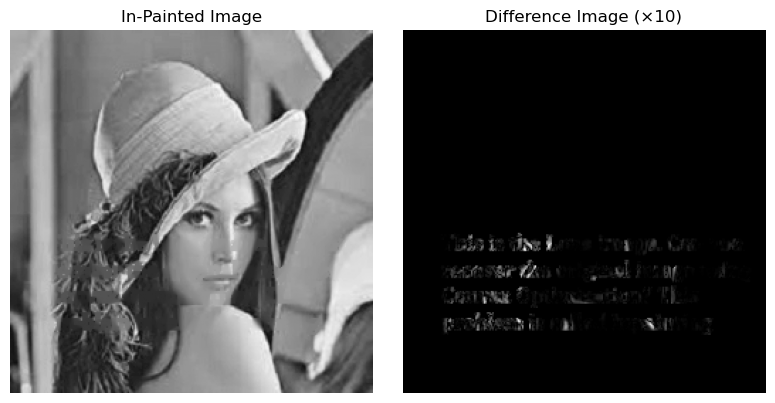

In [8]:
### **Loading and Visualizing the Data**

import matplotlib.pyplot as plt
import numpy as np
import cv2

# Load the images
u_orig = cv2.imread("images/lena.png", 0)
u_corr = cv2.imread("images/lena_corrupted.png", 0)
rows, cols = u_orig.shape

# known[i,j] = 1 if pixel is known, else 0
known = np.zeros((rows, cols))
for i in range(rows):
    for j in range(cols):
        if u_orig[i, j] == u_corr[i, j]:
            known[i, j] = 1

fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(u_orig, cmap='gray'), ax[0].set_title("Original Image"), ax[0].axis('off')
ax[1].imshow(u_corr, cmap='gray'), ax[1].set_title("Corrupted Image"), ax[1].axis('off')
plt.tight_layout()
plt.show()

### **TV Inpainting Optimization**
import cvxpy as cp
# Optimization variable
U = cp.Variable(shape=(rows, cols))
# Objective: minimize total variation
obj = cp.Minimize(cp.tv(U))
# Constraints: enforce known pixels
constraints = [
    cp.multiply(known, U) == cp.multiply(known, u_corr)
]
# Define and solve problem
prob = cp.Problem(obj, constraints)
prob.solve(verbose=True, solver=cp.SCS)
print("Optimal objective value:", obj.value)

### **Results and Error Visualization**
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
# In-painted image
ax[0].imshow(U.value, cmap='gray'), ax[0].set_title("In-Painted Image"), ax[0].axis('off')
# Difference image
img_diff = 10 * np.abs(u_orig - U.value)
ax[1].imshow(img_diff, cmap='gray'), ax[1].set_title("Difference Image (×10)"), ax[1].axis('off')
plt.tight_layout()
plt.show()

## **3. Proximal Optimization Methods**
### **3.1 Image Denoising with Proximal Gradient Methods — Lasso and TV priors**

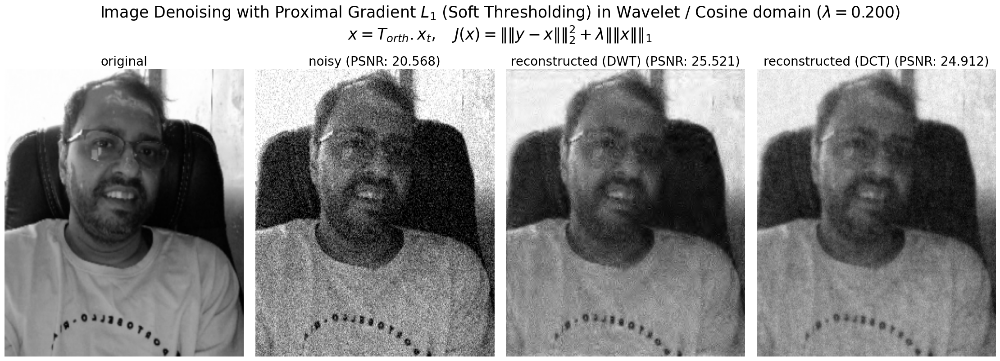

In [10]:
from skimage.util import random_noise
from scipy.fftpack import dct, idct
import pywt
import matplotlib.pylab as plt

def dct2(a):
    return dct(dct(a.T, norm='ortho').T, norm='ortho')

def idct2(a):
    return idct(idct(a.T, norm='ortho').T, norm='ortho')

def soft(x, T):
    return np.sign(x)*np.maximum(0, np.abs(x)-T)

im = cv2.resize(cv2.imread('images/me.jpg', 0), (256,256))
im_noisy = random_noise(im, var=0.01)
im = im / im.max()
im_noisy = im_noisy / im_noisy.max()
_, coeffs = pywt.coeffs_to_array(pywt.wavedec2(np.ones((255, 255)), 'db8', mode='periodization'))
y_w, _ = pywt.coeffs_to_array(pywt.wavedec2(im_noisy, 'db8', mode='periodization') )
y_w = y_w.ravel()
y_c = dct2(im_noisy)
y_c = y_c.ravel()

lambd = 0.2

x_w = soft(y_w, lambd/2)
im_rec_w = np.reshape(x_w, (256,256))
im_rec_w =  pywt.waverec2(pywt.array_to_coeffs(im_rec_w, coeffs, output_format='wavedec2'), 'db8', mode='periodization')
im_rec_w = im_rec_w / im_rec_w.max()
x_c = soft(y_c, lambd/2)
im_rec_c = np.reshape(x_c, (256,256))
im_rec_c = idct2(im_rec_c)
im_rec_c = im_rec_c / im_rec_c.max()

plt.figure(figsize=(22,8))
plt.gray()
plt.subplots_adjust(0,0,1,0.8,0.05,0.05)
plt.subplot(141), plt.imshow(im, aspect='auto'), plt.axis('off'), plt.title('original', size=20)
plt.subplot(142), plt.imshow(im_noisy, aspect='auto'), plt.axis('off'), plt.title('noisy (PSNR: {:.03f})'.format(psnr(im, im_noisy)), size=20)
plt.subplot(143), plt.imshow(im_rec_w, aspect='auto'), plt.axis('off'), plt.title('reconstructed (DWT) (PSNR: {:.03f})'.format(psnr(im, im_rec_w)), size=20)
plt.subplot(144), plt.imshow(im_rec_c, aspect='auto'), plt.axis('off'), plt.title('reconstructed (DCT) (PSNR: {:.03f})'.format(psnr(im, im_rec_c)), size=20)
plt.suptitle('Image Denoising with Proximal Gradient $L_1$ (Soft Thresholding) in Wavelet / Cosine domain ' +   \
             r'($\lambda=$' + '{:.3f})\n'.format(lambd) + \
             r'$x = T_{orth}.x_t, \quad J(x) = \|\|y-x\|\|^2_2+\lambda\|\|x\|\|_1$', size=25)
plt.show()

### **Demonstration code (TV via gradient-projection)**

Solving with denoise GP


C:\Users\Sandipan.Dey\anaconda3\lib\site-packages\ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log


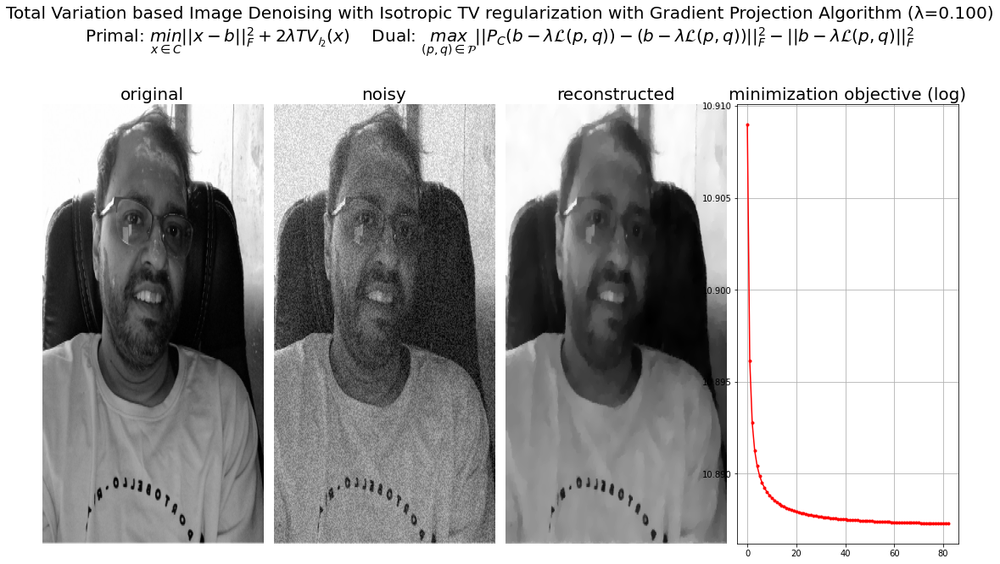

In [290]:
# http://www.math.tau.ac.il/~teboulle/papers/tlv.pdf
def L_op(p, q):
    m, n = q.shape[0], p.shape[1]
    L_pq = np.zeros((m,n))
    p = np.vstack((np.zeros(n),p,np.zeros(n)))
    p = np.hstack((np.zeros((p.shape[0], 1)), p))
    q = np.hstack((np.zeros((m,1)),q,np.zeros((m,1))))
    q = np.vstack((np.zeros(q.shape[1]), q))
    L_pq = p[1:,1:] + q[1:,1:] - p[:-1,1:] - q[1:,:-1] 
    return L_pq

def L_T_op(X):
    p, q = X[:-1,:] - X[1:,:], X[:,:-1] - X[:,1:]
    return p, q

def projection_pq(p, q):
    m, n = q.shape[0], p.shape[1]   
    r, s = np.zeros(p.shape), np.zeros(q.shape)
    d = np.maximum(1, np.sqrt(p[:,:-1]**2+q[:-1,:]**2))
    r[:,:-1], s[:-1,:] = p[:,:-1] / d, q[:-1,:] / d
    r[:,n-1] = p[:,n-1] / np.maximum(1,np.abs(p[:,n-1]))
    s[m-1,:] = q[m-1,:] / np.maximum(1,np.abs(q[m-1,:]))
    return r, s
                                 
def proj_C(X, ub, lb):
    return X
    #return np.clip(X, ub, lb)
                                 
def denoise_GP(b, lambd, max_iter, lb, ub):
    print('Solving with denoise GP')
    m, n = b.shape
    p, q = np.zeros((m-1,n)), np.zeros((m,n-1))
    loop_tol = 1e-4
    Gr = np.zeros((m,n))
    h = np.zeros(max_iter)
    for k in range(max_iter):
        b_L = b - lambd*L_op(p,q)
        proj_b = proj_C(b_L, ub, lb)
        L_T_p, L_T_q = L_T_op(proj_b);
        p_pr, q_pr = p + (1/(8*lambd))*L_T_p, q + (1/(8*lambd))*L_T_q
        p, q = projection_pq(p_pr,q_pr)
        Gr_old, Gr = Gr, proj_b
        h[k] = -np.linalg.norm(b_L - proj_b ,'fro')**2 + np.linalg.norm(b_L,'fro')**2
        rel_dif = np.linalg.norm(Gr - Gr_old,'fro') / np.linalg.norm(Gr,'fro')
        if k > 1 and rel_dif <= loop_tol: break
    X_opt = proj_C(b - lambd*L_op(p,q), ub, lb)
    return X_opt, h    

img = cv2.resize(cv2.imread('images/me.jpg', 0), None, fx=1/2, fy=1/2)
X = img/img.max()
b = X + 3e-1*np.random.rand(np.prod(X.shape)).reshape((X.shape))
lambd = 0.1
max_iter = 100
X_opt,h = denoise_GP(b, lambd, max_iter, -np.Inf, np.Inf)

plt.figure(figsize=(15,9))
plt.gray()                                 
plt.subplots_adjust(0,0,1,0.8,0.05,0.05)
plt.subplot(141), plt.imshow(X, aspect='auto'), plt.title('original', size=20), plt.axis('off')
plt.subplot(142), plt.imshow(b, aspect='auto'), plt.title('noisy', size=20), plt.axis('off')
plt.subplot(143), plt.imshow(X_opt, aspect='auto'), plt.title('reconstructed', size=20), plt.axis('off')
plt.subplot(144), plt.plot(range(len(h)), np.log(h), 'r.-'), plt.title('minimization objective (log)', size=20), plt.grid()
plt.suptitle('Total Variation based Image Denoising with Isotropic TV regularization with Gradient Projection Algorithm (λ={:.03f})\n'.format(lambd) + 
             r'Primal: $\underset{x\in C}{min}\|\|x-b\|\|_F^2+2\lambda TV_{\mathcal{l}_2}(x)\quad$ ' + 
             r'Dual: $\underset{(p,q)\in \mathcal{P}}{max}\|\|P_C(b-\lambda \mathcal{L}(p,q))-(b-\lambda \mathcal{L}(p,q))\|\|_F^2-\|\|b-\lambda \mathcal{L}(p,q)\|\|_F^2$', size=20)
plt.show()

### **3.2 Solving Inverse Problems in Imaging with ISTA, FISTA, and ADMM Algorithms**
### **Demonstration Code**

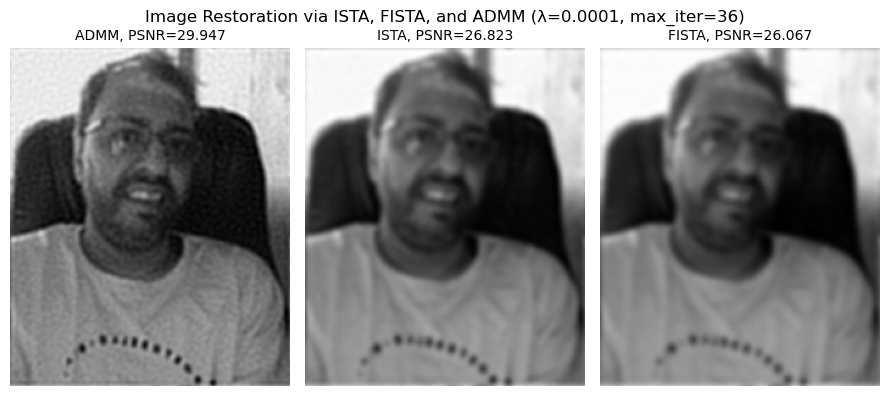

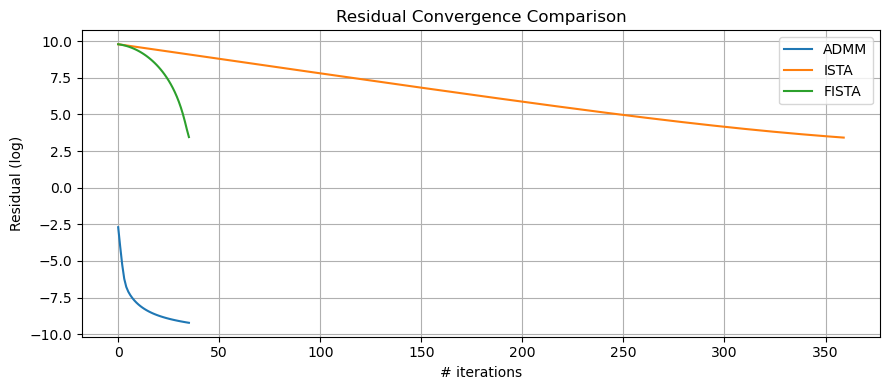

In [56]:
import numpy as np
from numpy import sqrt
from scipy.signal import convolve2d
import cv2
import matplotlib.pylab as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# --- Proximal Operators ---
def proj(x, bounds=[0,1]):
    return np.clip(x, bounds[0], bounds[1])

def prox_l1(x, T):
    return np.sign(x)*np.maximum(0, np.abs(x)-T)

# --- ISTA Implementation ---
def ISTA(y,h,lambd, alpha=1, tol=1e-4, max_itr=50):
    H = lambda y: convolve2d(y,h,mode='same',boundary='circular')
    Ht = lambda y: convolve2d(y,h,mode='same',boundary='circular')
    x = np.zeros_like(y)
    residuals = []
    for _ in range(max_itr):
        x = x + (1/alpha)*(Ht(y)-Ht(H(x)))
        x = prox_l1(x, lambd / (2*alpha))
        residual = np.sum((y-H(x))**2) + lambd*np.sum(np.abs(x))
        residuals.append(residual)
    return x, residuals

# --- FISTA Implementation ---
def FISTA(y,h,lambd, alpha=1, tol=1e-4, max_itr=50):
    H = lambda y: convolve2d(y,h,mode='same',boundary='circular')
    Ht = lambda y: convolve2d(y,h,mode='same',boundary='circular')
    x0 = np.zeros_like(y)
    y1 = x0.copy()
    t1 = 1
    residuals = []
    for _ in range(max_itr):
        x1 = y1 + (1/alpha)*(Ht(y)-Ht(H(y1)))
        x1 = prox_l1(x1, lambd / alpha)
        t2 = (1+np.sqrt(1+4*t1**2))/2
        y1 = x1 + (t1-1)/t2*(x1-x0)
        x0, t1 = x1, t2
        residual = np.sum((y-H(x1))**2) + lambd*np.sum(np.abs(x1))
        residuals.append(residual)
    return x1, residuals

# --- ADMM Implementation ---
def ADMM(y,h,lambd, rho=1, max_itr=50, tol=1e-4, gamma=1, alpha=1.5):
    dim = y.shape
    Hty = convolve2d(y,h,mode='same',boundary='circular')
    eigHtH = (np.abs(np.fft.fftn(h, s=dim)))**2
    v = 0.5*np.ones(dim)
    x = v.copy()
    u = np.zeros(dim)
    residuals = []
    for _ in range(max_itr):
        rhs = np.fft.fftn(Hty+rho*(v-u),s=dim)
        x = np.real(np.fft.ifftn(rhs/(eigHtH+rho),s=dim))
        v_old = v.copy()
        x_hat = alpha*x + (1 - alpha)*v_old
        v = prox_l1(x_hat + u, lambd/rho)
        u += (x_hat - v)
        rho *= gamma
        residual = np.linalg.norm(x - v) / np.sqrt(np.prod(dim))
        residuals.append(residual)
    return v, residuals

# --- Load Image and Prepare Observation ---
img = cv2.imread('images/me.jpg', 0)
img = cv2.resize(img, None, fx=1/2, fy=1/2)
img = img / img.max()

k, sigma = 7, 2
g1 = np.array([np.exp(-(x**2/2/sigma**2)) for x in range(-k,k+1)])
h = np.outer(g1, g1)
h = h / h.sum()

np.random.seed(0)
noise_level = 10/255
y = convolve2d(img, h, mode='same', boundary='circular')
y += noise_level*np.random.rand(*img.shape)
y /= y.max()

lambd, max_itr = 1e-4, 36

out_ADMM, r_ADMM = ADMM(y,h,lambd,max_itr=max_itr)
out_ISTA, r_ISTA = ISTA(y,h,lambd,alpha=100,max_itr=10*max_itr)
out_FISTA, r_FISTA = FISTA(y,h,lambd,alpha=100,max_itr=max_itr)

# --- Display Results ---
plt.figure(figsize=(9,4))
plt.subplot(131), plt.imshow(out_ADMM), plt.axis('off'), plt.title(f'ADMM, PSNR={psnr(img,out_ADMM):.3f}', size=10)
plt.subplot(132), plt.imshow(out_ISTA), plt.axis('off'), plt.title(f'ISTA, PSNR={psnr(img,out_ISTA):.3f}', size=10)
plt.subplot(133), plt.imshow(out_FISTA), plt.axis('off'), plt.title(f'FISTA, PSNR={psnr(img,out_FISTA):.3f}', size=10)
plt.suptitle(f'Image Restoration via ISTA, FISTA, and ADMM (λ={lambd}, max_iter={max_itr})', size=12)
plt.tight_layout()
plt.show()

plt.figure(figsize=(9,4))
plt.plot(np.log(r_ADMM), label='ADMM')
plt.plot(np.log(r_ISTA), label='ISTA')
plt.plot(np.log(r_FISTA), label='FISTA')
plt.legend(); plt.grid()
plt.xlabel('# iterations', size=10)
plt.ylabel('Residual (log)', size=10)
plt.title('Residual Convergence Comparison', size=12)
plt.tight_layout()
plt.show()

### **3.3 Image Inpainting with FISTA Algorithm**

In [1]:
# https://github.com/EliaFantini/Image-Reconstructor-FISTA-proximal-method-on-wavelets-transform
import numpy as np
import cv2
import pywt
import pywt.data
import matplotlib.pylab as plt
from random import randint
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
from skimage.restoration import denoise_tv_chambolle
from skimage.metrics import structural_similarity as ssim
import time

time taken by FISTA: 3.1890368461608887
time taken by FISTA: 8.196538209915161


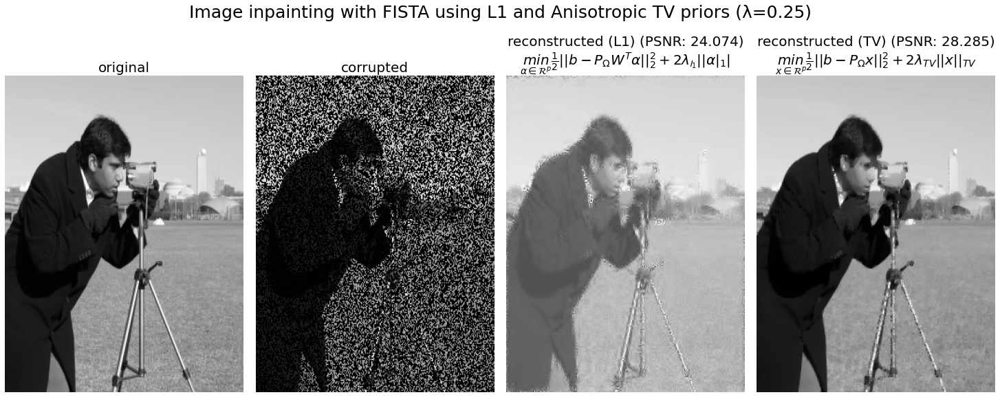

In [62]:
# Operators 

# P_Ω and p_Ω_T
def p_Ω(x, indices):  # P_Ω
    return np.expand_dims(x[np.unravel_index(indices, x.shape)], 1)

def p_Ω_T(x, indices, m):  # P_Ω^T
    y = np.zeros((m, m))
    y[np.unravel_index(indices, y.shape)] = x.squeeze()
    return y

def apply_random_mask(image, rate=0.25):
    mask = np.random.random(image.shape)
    mask[mask > rate] = 0
    mask[mask > 0] = 1
    return image * mask, mask

def psnr(ref, recon):
    mse = np.sqrt(((ref - recon) ** 2).sum() / np.prod(ref.shape))
    return 20 * np.log10(ref.max() / mse)

class RepresentationOperator(object):
    def __init__(self, m=256):
        self.m = m
        self.N = m ** 2
        self.W_operator = lambda x: pywt.wavedec2(x, 'db8', mode='periodization')  # From image coefficients to wavelet
        self.WT_operator = lambda x: pywt.waverec2(x, 'db8', mode='periodization')  # From wavelet coefficients to image
        _, self.coeffs = pywt.coeffs_to_array(self.W_operator(np.ones((m, m))))

    def W(self, x):
        x = np.reshape(x, (self.m, self.m))
        wav_x, _ = pywt.coeffs_to_array(self.W_operator(x))
        return np.reshape(wav_x, (self.N, 1))

    def WT(self, wav_x):
        wav_x = np.reshape(wav_x, (self.m, self.m))
        x = self.WT_operator(pywt.array_to_coeffs(wav_x, self.coeffs, output_format='wavedec2'))
        return np.reshape(x, (self.N, 1))


def FISTA(fx, gx, gradf, proxg, N, λ, L, maxit):
    tic_start = time.time()
    # Initialize parameters
    x0 = np.zeros((N, 1))
    α = 1 / L
    y_k = x0
    t_k = 1
    x_k = x0
    errors = np.zeros(maxit)
    for k in range(maxit):
        # Update iterate        
        x_k_next = proxg(y_k - α * gradf(y_k), α)
        t_k_next = (1 + np.sqrt(4 * (t_k ** 2) + 1)) / 2
        y_k_next = x_k_next + ((t_k - 1) / t_k_next) * (x_k_next - x_k)
        y_k, t_k, x_k = y_k_next, t_k_next, x_k_next
        # Compute error and save data to be plotted later on.
        errors[k] = fx(x_k) + λ * gx(x_k)
        #if k % 5 == 0:
        #    print(errors[k])
            
    print('time taken by FISTA: {}'.format(time.time() - tic_start))
    return x_k, errors

def reconstruct_l1(image, indices, m, λ=0.01, L=1, maxit=200):
    # Wavelet operator
    r = RepresentationOperator(m)
    # Define the overall operator
    A = lambda x: p_Ω(r.WT(x), indices)  # P_Ω.W^T
    AT = lambda x: r.W(p_Ω_T(x,indices,m))  # W. P_Ω^T
    # Generate measurements
    b = p_Ω(image, indices)
    fx = lambda x: (1/2) *(np.linalg.norm(b - A(x)))**2
    gx = lambda x:  np.linalg.norm(x, 1)
    proxg = lambda y, λ: np.sign(y)*np.maximum(np.abs(y) - λ, 0) 
    gradf = lambda x: AT(A(x) - b)
    x, errors = FISTA(fx, gx, gradf, proxg, m*m, λ, L, maxit)
    return r.WT(x).reshape((m, m))

def tv_norm(X, opt=None):
    m, n = X.shape
    P1 = X[0:m - 1, :] - X[1:m, :]
    P2 = X[:, 0:n - 1] - X[:, 1:n]
    if opt == 'iso':
        D = np.zeros_like(X)
        D[0:m - 1, :] = P1 ** 2
        D[:, 0:n - 1] = D[:, 0:n - 1] + P2 ** 2
        tv_out = np.sum(np.sqrt(D))
    else:
        tv_out = np.sum(np.abs(P1)) + np.sum(np.abs(P2))
    return tv_out

def reconstruct_tv(image, indices, m, λ=0.01, L=1, maxit=200):    
    # Define the overall operator
    A = lambda x: p_Ω(x,indices)  # P_Omega
    AT = lambda x: p_Ω_T(x,indices, m) # P_Omega^T
    # Generate measurements
    b = A(image)
    fx = lambda x: (1/2) *(np.linalg.norm(b - A(x)))**2
    gx = lambda x: tv_norm(x)
    proxg = lambda x, y: denoise_tv_chambolle(x.reshape((m,m)),
                                              weight=λ * y, eps=1e-5,
                                              n_iter_max=50).reshape((m*m, 1))
    gradf = lambda x: AT(A(x) - b).reshape(x.shape[0],1)
    x, errors = FISTA(fx, gx, gradf, proxg, m*m, λ, L, maxit)
    return x.reshape((m,m))

shape = (256, 256)
# Choose optimization parameters
m = 256
rate_noise = 0.4
L = 1
λ = 0.25

image = cv2.resize(cv2.imread('images/cameraman.png', 0), (m,m))
image_corrupted, mask = apply_random_mask(image, rate_noise)
indices = np.nonzero(mask.flatten())[0]

# Reconstruction with L1 
reconstruction_l1 = reconstruct_l1(image, indices, m, λ)
reconstruction_tv = reconstruct_tv(image, indices, m, λ)

plt.figure(figsize=(20,8))
plt.gray()                                 
plt.subplots_adjust(0,0,1,0.8,0.05,0.05)
plt.subplot(141), plt.imshow(image, aspect='auto'), plt.title('original', size=20), plt.axis('off')
plt.subplot(142), plt.imshow(image_corrupted, aspect='auto'), plt.title('corrupted', size=20), plt.axis('off')
plt.subplot(143), plt.imshow(reconstruction_l1, aspect='auto')
plt.title('reconstructed (L1) (PSNR: {:.03f})\n'.format(psnr(image, reconstruction_l1)) + \
          r'$\underset{\lambda\in \mathcal{R}^p}{min}\frac{1}{2}\|\|b-P_{\Omega}W^T\lambda\|\|_2^2+2\lambda_{\mathcal{l}_1}\|\|\lambda\|_1\|\quad$', size=20)
plt.axis('off')
plt.subplot(144), plt.imshow(reconstruction_tv, aspect='auto')
plt.title('reconstructed (TV) (PSNR: {:.03f})\n'.format(psnr(image, reconstruction_tv)) + \
          r'$\underset{x\in \mathcal{R}^p}{min}\frac{1}{2}\|\|b-P_{\Omega}x\|\|_2^2+2\lambda_{TV}\|\|x\|\|_{TV}\quad$', size=20)
plt.axis('off')
plt.suptitle('Image inpainting with FISTA using L1 and Anisotropic TV priors (λ={:.02f})\n'.format(λ), size=25) 
plt.show()

## **4. Sparse Optimization in Imaging**

In [60]:
def dictionary_from_transform(transform, n, K, normalized=True, inverse=False):
    H = np.zeros((K, n))
    for i in range(n):
        v = np.zeros(n)
        v[i] = 1.0
        H[:, i] = transform(v, sampling_factor=K)
    if inverse:
        H = H.T
    return np.kron(H.T, H.T)

def dct_transform(v, normalized=True, sampling_factor=None):
    n = v.shape[0]
    K = sampling_factor if sampling_factor else n
    y = np.array([sum(np.multiply(v, np.cos((0.5 + np.arange(n)) * k * np.pi / K))) for k in range(K)])
    if normalized:
        y[0] = 1 / np.sqrt(2) * y[0]
        y = np.sqrt(2 / n) * y
    return y

def haar_transform(v, sampling_factor=None):
    n = v.shape[0]
    K = sampling_factor if sampling_factor else n
    tmp = np.zeros(K)
    count = 2
    while count <= n:
        for i in range(int(count / 2)):
            tmp[2 * i] = (v[i] + v[i + int(count / 2)]) / np.sqrt(2)
            tmp[2 * i + 1] = (v[i] - v[i + int(count / 2)]) / np.sqrt(2)
        for i in range(count):
            v[i] = tmp[i]
        count *= 2
    return np.array(tmp).astype(float)

def get_dct_dictionary(n, K):
    assert(K >= n)
    return dictionary_from_transform(dct_transform, n, K, inverse=False)

def get_haar_dictionary(n, K):
    assert(K >= n)
    return dictionary_from_transform(haar_transform, n, K, inverse=False)

In [50]:
n, K = 8, 16
D = get_dct_dictionary(n, K)
#n, K = 8, 8
#D = get_haar_dictionary(n, K)
print(D.shape)
#D = dictionary_to_img(D)

def plot_dict(D, n, K):
    plt.figure(figsize=(6,6))
    plt.subplots_adjust(0,0,1,1,0.1,0.1)
    plt.gray()
    for k in range(K**2):
        plt.subplot(K,K,k+1), plt.imshow(D[:,k].reshape(n,n)), plt.axis('off')
    plt.show()

#plot_dict(D, n, K)

(64, 256)


### **4.1 Orthogonal Matching Pursuit (OMP): The Greedy Strategy**
### **The OMP Algorithm**
### **4.2 Inpainting Image Inpainting with Sparse Representations (OMP)**

In [ ]:
# https://github.com/chongyangtao/Color-Image-Inpainting
# https://www.chegg.com/homework-help/questions-and-answers/kercise-8-inpainting-plement-method-solving-inpainting-problem-region-d-subset-omega-unkno-q100507908
from scipy.sparse import dok_matrix as sparse
from scipy.sparse.linalg import lsqr

def overlap_im2col(I, bb, overlap):
    M, N = I.shape
    X = np.array([])
    # Calculate how many patches fit horisontally and vertically
    row = (M - bb)//overlap
    col = (N - bb)//overlap
    # Iterate through patches
    for i in range(row):
        for j in range(col):
            # Take a patch with top-left corner at (i, j) and vectorise it
            # fprintf('%bb  %bb | %bb  %bb \n',1+i*overlap,bb+i*overlap,1+j*overlap,bb+j*overlap)
            x_patch, y_patch = np.arange(bb)+i*overlap, np.arange(bb)+j*overlap
            pij = I[x_patch[:,None],y_patch[None,:]].reshape(-1,1)            
            X = pij if len(X) == 0 else np.hstack((X, pij))
    return X    

def overlap_col2im(X, Mask, bb, overlap, im_size):
    # Get image dimensions
    M, N = im_size
    # Initialise the image
    I = np.zeros((M, N))
    # Initialise the matrix that stores the cubetalative signal used to calculate each pixel
    S = np.zeros((M, N))
    # Calculate how many patches fit horisontally and vertically
    row = (M - bb)//overlap
    col = (N - bb)//overlap
    # Iterate through patches and keep a counter to know what column of X to access next
    counter = 0
    for i in range(row):
        for j in range(col): 
            # Get x and y range of current patch
            x_patch, y_patch = np.arange(bb)+i*overlap, np.arange(bb)+j*overlap
            # Get existing patch
            existing_patch = I[x_patch[:,None],y_patch[None,:]]
            # Get current patch and calculate its signal strength
            current_patch = np.reshape(X[:,counter], (bb, bb))
            signal = np.sum(Mask[:,counter]!=0)
            # Update cubetalative signal strength
            S[x_patch[:,None],y_patch[None,:]] += signal
            # Update patch
            I[x_patch[:,None],y_patch[None,:]] = existing_patch + current_patch*signal
            counter += 1
    #S = S / S.max()
    # If a pixel was not covered by a single patch with signal, set its signal
    # value to 1, in order to prevent division by zero
    S[S == 0] = 1
    # Divide each pixel by its corresponding cubetalative signal coverage
    I = I / S
    return I

def OMP_Inpainting(D,X,Mask,sigma,rc_min, max_coeff):    
    n,P = X.shape # 64 * 552108
    n,K = D.shape
    A = sparse((D.shape[1],X.shape[1]))
    for k in range(P):
        Mpos = np.nonzero(Mask[:,k])[0]
        indx = []
        if len(Mpos) > 0:
            Dict = D[Mpos,:]
            #W = 1/np.sqrt(np.diag(Dict.T@Dict))
            #Dict = Dict@np.diag(W)
            x = X[Mpos,k] # patch exclude mask
            residual, a = x, None
            j, rc_max = 0, np.inf
            threshold = np.linalg.norm(x)*sigma
            DD = np.array([]) 
            while np.linalg.norm(residual) > threshold and rc_max > rc_min and np.sum(a!=0) < max_coeff:
                proj = np.abs(Dict.T@residual)
                pos = np.argmax(proj)
                rc_max = proj[pos]
                DD = Dict[:,pos].reshape(-1,1) if len(DD) == 0 else np.hstack((DD, Dict[:,pos].reshape(-1,1)))
                indx.append(pos)
                a = lsqr(DD, x)[0]
                residual = x - DD@a
                j += 1                       
        if len(indx) > 0:
            A[indx,k] = a
            #A[:,k]=W*A[:,k]            
        if k % 1000 == 0:
            print(f'iter:  {k}/{P} | (%{k/P}%%)')
    return A

bb = 8
K = 16
D = get_dct_dictionary(bb, K)
im = cv2.imread('images/lena256.jpg', 0)

im = im / im.max()
M, N = im.shape
overlap = 3
        
#Compute mask and extracting its patches
mask = (img_mask < 0.3)
blk_mask = overlap_im2col(mask, bb, overlap)
        
# Extracting the noisy image patches
blk_matrix_im = overlap_im2col(im, bb, overlap)

sigma = 0.001 #  % 0.005  0.01
rc_min = 0.01 # rc_min: minimal residual correlation before stopping pursuit
max_coeff = 10 # max_coeff: sparsity constraint for signal representation 10

# Inpainting the Patches (OMP)
Coeff = OMP_Inpainting(D,blk_matrix_im*blk_mask,blk_mask,sigma,rc_min,max_coeff) #256*146405
Coeff = Coeff.toarray()

# Creating the output image
out_mask = overlap_col2im(D@Coeff, blk_mask, bb, overlap, img_mask.shape)
out_mask = out_mask / out_mask.max()

### **4.3 Image Denoising with Sparse Representations (OMP)**

In [ ]:
# https://github.com/chongyangtao/Color-Image-Inpainting
# https://www.chegg.com/homework-help/questions-and-answers/kercise-8-inpainting-plement-method-solving-inpainting-problem-region-d-subset-omega-unkno-q100507908
from scipy.sparse import dok_matrix as sparse
from scipy.sparse.linalg import lsqr
from skimage.metrics import peak_signal_noise_ratio as psnr

def overlap_col2im(X, bb, overlap, im_size):
    # Get image dimensions
    M, N = im_size
    # Initialise the image
    I = np.zeros((M, N))
    # Initialise the matrix that stores the cubetalative signal used to calculate each pixel
    S = np.zeros((M, N))
    # Calculate how many patches fit horisontally and vertically
    row = (M - bb)//overlap
    col = (N - bb)//overlap
    # Iterate through patches and keep a counter to know what column of X to access next
    counter = 0
    for i in range(row):
        for j in range(col): 
            # Get x and y range of current patch
            x_patch, y_patch = np.arange(bb)+i*overlap, np.arange(bb)+j*overlap
            # Get existing patch
            existing_patch = I[x_patch[:,None],y_patch[None,:]]
            # Get current patch and calculate its signal strength
            current_patch = np.reshape(X[:,counter], (bb, bb))
            #signal = np.sum(Mask[:,counter]!=0)
            # Update cubetalative signal strength
            S[x_patch[:,None],y_patch[None,:]] += 1 
            # Update patch
            I[x_patch[:,None],y_patch[None,:]] = existing_patch + current_patch
            counter += 1
    S = S / S.max()
    # If a pixel was not covered by a single patch with signal, set its signal
    # value to 1, in order to prevent division by zero
    S[S == 0] = 1
    # Divide each pixel by its corresponding cubetalative signal coverage
    I = I / S
    return I

def OMP_denoising(D,X,sigma,rc_min, max_coeff, orig, noisy, bb, KK, ch):    
    n,P = X.shape # 64 * 552108
    n,K = D.shape
    A = sparse((D.shape[1],X.shape[1]))
    for k in range(P):
        indx = []
        Dict = D
        #W = 1/np.sqrt(np.diag(Dict.T@Dict))
        #Dict = Dict@np.diag(W)
        x = X[:,k] # patch exclude mask
        residual, a = x, None
        j, rc_max = 0, np.inf
        threshold = np.linalg.norm(x)*sigma
        DD = np.array([]) 
        while np.linalg.norm(residual) > threshold and rc_max > rc_min and np.sum(a!=0) < max_coeff:
            proj = np.abs(Dict.T@residual)
            pos = np.argmax(proj)
            rc_max = proj[pos]
            DD = Dict[:,pos].reshape(-1,1) if len(DD) == 0 else np.hstack((DD, Dict[:,pos].reshape(-1,1)))
            indx.append(pos)
            a = lsqr(DD, x)[0]
            residual = x - DD@a
            j += 1                       
        if len(indx) > 0:
            A[indx,k] = a
            #A[:,k]=W*A[:,k]            
        if k % 20 == 0:
            print(f'iter:  {k}/{P} | (%{k/P}%%)')
            out = overlap_col2im(D@A.toarray(), bb, 3, orig.shape)
            out = out / out.max()
            plt.imsave('out/out_{:03d}_{:03d}_{:03d}_{}.png'.format(bb, KK, k, ch), out)
            #plot_images(orig, noisy, rec, bb, KK, k)

    return A

from skimage.color import rgb2ycbcr, ycbcr2rgb

bb = 8
K = 16
D = get_dct_dictionary(bb, K)
im = plt.imread('images/mandrill.jpg')[...,:3]
im = im / im.max()
im_noisy = im + 0.2*np.random.randn(np.prod(im.shape)).reshape(im.shape)
im_noisy = (im_noisy - im_noisy.min()) / (im_noisy.max() - im_noisy.min())

#im_noisy_y = rgb2ycbcr(im_noisy)

M, N, _ = im.shape
overlap = 3
im_out = np.copy(im_noisy)

for i in range(3):
    # Extracting the noisy image patches
    blk_matrix_im = overlap_im2col(im_noisy[...,i], bb, overlap)

    sigma = 0.01 #  % 0.005  0.01
    rc_min = 0.01 # rc_min: minimal residual correlation before stopping pursuit
    max_coeff = 10 # max_coeff: sparsity constraint for signal representation 10

    # Inpainting the Patches (OMP)
    Coeff = OMP_denoising(D,blk_matrix_im,sigma,rc_min,max_coeff, im[...,i], im_noisy[...,i], bb, K, i) #256*146405
    Coeff = Coeff.toarray()

    # Creating the output image
    im_out[...,i] = overlap_col2im(D@Coeff, bb, overlap, (M,N))
    
out = im_out # ycbcr2rgb(im_out)
out = out / out.max()

## **5. Image Colorization with Optimization**

In [ ]:
import numpy as np
import scipy
import scipy.sparse as sp
from scipy.optimize import minimize	
from scipy import io, misc
from collections import defaultdict
import matplotlib.image as mpimg
import matplotlib.pylab as plt

### Color-space helpers
def rgb2yuv(rgb):
    yuv = np.zeros(rgb.shape)
    yuv[:, :, 0] = 0.299*rgb[:,:,0] + 0.587*rgb[:,:,1] + 0.114*rgb[:,:,2]
    yuv[:, :, 1] = 0.492*(rgb[:,:,2] - yuv[:, :, 0])
    yuv[:, :, 2] = 0.877*(rgb[:,:,0] - yuv[:, :, 0])
    #yuv = yuv.astype(np.uint8)
    #plt.imshow(yuv); plt.show();  plt.imshow(yuv[:,:,0]); plt.show(); plt.imshow(yuv[:,:,1]); plt.show(); plt.imshow(yuv[:,:,2]); plt.show()
    return yuv

def yuv2rgb(yuv):
    rgb = np.zeros(yuv.shape)
    rgb[:, :, 0] = yuv[:,:,0] + 1.13983*yuv[:,:,2]
    rgb[:, :, 1] = yuv[:,:,0] - 0.39465*yuv[:,:,1] - 0.58060*yuv[:,:,2]
    rgb[:, :, 2] = yuv[:,:,0] + 2.03211*yuv[:,:,1]
    #rgb = rgb.astype(np.uint8)
    #plt.imshow(rgb); plt.show();
    return rgb

def rgb2yiq(rgb):
    rgb = rgb / 255.0
    y = np.clip(np.dot(rgb, np.array([0.299, 0.587, 0.144])),             0,   1)
    i = np.clip(np.dot(rgb, np.array([0.595716, -0.274453, -0.321263])), -0.5957, 0.5957)
    q = np.clip(np.dot(rgb, np.array([0.211456, -0.522591, 0.311135])),  -0.5226, 0.5226)
    yiq = rgb
    yiq[..., 0] = y
    yiq[..., 1] = i
    yiq[..., 2] = q
    return yiq

def yiq2rgb(yiq):
    r = np.dot(yiq, np.array([1.0,  0.956295719758948,  0.621024416465261]))
    g = np.dot(yiq, np.array([1.0, -0.272122099318510, -0.647380596825695]))
    b = np.dot(yiq, np.array([1.0, -1.106989016736491,  1.704614998364648]))
    rgb = yiq
    rgb[:, :, 0] = r
    rgb[:, :, 1] = g
    rgb[:, :, 2] = b
    return np.clip(rgb, 0.0, 1.0) * 255.0

In [ ]:
def get_nbrs(Y, x, y, w, h):
    sigma = 0
    nbrs = []
    if x > 0:
        nbrs += [(x-1, y)]
    if y > 0:
        nbrs += [(x, y-1)]
    if x > 0 and y > 0:
        nbrs += [(x-1, y-1)]
    if x < w-1:
        nbrs += [(x+1, y)]
    if y < h-1:
        nbrs += [(x, y+1)]
    if x < w-1 and y < h-1:
        nbrs += [(x+1, y+1)]
    if x > 0  and y < h-1:
        nbrs += [(x-1, y+1)]
    if x < w-1 and y > 0:
        nbrs += [(x+1, y-1)]
    return (nbrs, np.std([Y[x1,y1] for (x1,y1) in nbrs] + [Y[x,y]]) if not Y is None else None) # + 0.01

def neighborhood(X, r):
    d = 1
    l1, h1 = max(r[0]-d, 0), min(r[0]+d+1, X.shape[0])
    l2, h2 = max(r[1]-d, 0), min(r[1]+d+1, X.shape[1])
    return X[l1:h1, l2:h2]

def ij2id(i, j, w, h):
    return h*i + j

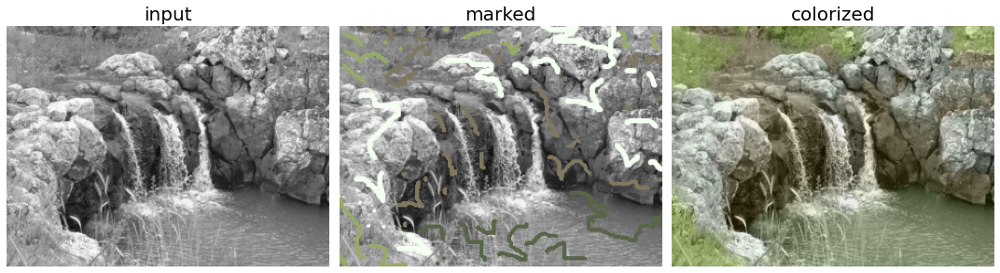

In [40]:
def find_marked_locations(bw, marked):
    diff = marked - bw
    colored = [set(zip(*np.nonzero(diff[:, :, i]))) for i in [1, 2]]
    return colored[0].union(colored[1])

def sum_sqr_dist(U, W, w, h):
    sum_sqr = 0
    for r in range(len(U)):
        x, y = r % w, r / h
        nbrs, _ = get_nbrs(None, x, y, w, h) 
        sum_sqr += (U[r] - sum([W[(x,y),(x1,y1)]*U[w*x1+y1] for (x1,y1) in nbrs]))**2
    return sum_sqr	

def compute_W(Y, colored):
    (w, h) = Y.shape	
    W = defaultdict()
    for i in range(w):
        for j in range(h):
            if not (i, j) in colored:
                (N, sigma) = get_nbrs(Y, i, j, w, h) #r = (i, j)
                Z = 0.
                id1 = ij2id(i,j,w,h)
                for (i1, j1) in N: 					 #s = (i1, j1)
                    id2 = ij2id(i1,j1,w,h)
                    W[id1,id2] = np.exp(-(Y[i,j]-Y[i1,j1])**2/(sigma**2)) if sigma > 0 else 0.
                    Z += W[id1,id2]
                if Z > 0:	
                    for (i1, j1) in N: 				 #s = (i1, j1)
                        id2 = ij2id(i1,j1,w,h)
                        W[id1,id2] /= -Z
    for i in range(w):
        for j in range(h):
            id = ij2id(i,j,w,h)
            W[id,id] = 1.
    rows, cols = zip(*(W.keys())) #keys
    data = list(W.values()) #[W[k] for k in keys]
    return sp.csc_matrix((data, (list(rows), list(cols))), shape=(w*h, w*h)) #W

def colorize_opt(yuv, yuvm):
    Y = yuv[:,:,0]
    colored = find_marked_locations(yuv, yuvm)
    W = compute_W(Y, colored)
    U, V = yuvm[:,:,1], yuvm[:,:,2]
    U_vec, V_vec = U.ravel(), V.ravel()
    LU = sp.linalg.splu(W)
    sol = np.zeros(np.shape(yuvm))
    sol[:, :, 0] = Y
    U1 = LU.solve(U_vec).reshape((U.shape[0], U.shape[1]))
    V1 = LU.solve(V_vec).reshape((V.shape[0], V.shape[1]))
    #U1[U1 < 0], V1[V1 < 0] = 0., 0.
    sol[:, :, 1] = U1
    sol[:, :, 2] = V1
    return sol

imfile = 'images/waterfall_gray.png' 
imfile_marked = 'images/waterfall_gray_marked.png' 
gray = mpimg.imread(imfile)[...,:3]
gray_marked = mpimg.imread(imfile_marked)[...,:3]
yuv = rgb2yiq(gray)
yuv_marked = rgb2yiq(gray_marked)
yuv_colorized = colorize_opt(yuv, yuv_marked)
rgb_colorized  = yiq2rgb(yuv_colorized)
rgb_colorized = rgb_colorized / rgb_colorized.max()

plt.figure(figsize=(15,7))
plt.gray()
plt.subplot(131), plt.imshow(gray), plt.axis('off'), plt.title('input', size=20)
plt.subplot(132), plt.imshow(gray_marked), plt.axis('off'), plt.title('marked', size=20)
plt.subplot(133), plt.imshow(rgb_colorized), plt.axis('off'), plt.title('colorized', size=20)
plt.tight_layout()
plt.show()

## **6. Optimization in Image Resizing and Synthesis**
### **6.1 Seam Carving – Context Aware Image Resizing, Retargeting and Object Removal**

In [ ]:
def compute_energy(m, n, d, u):
    u1 = np.zeros((m+2, n+2, d))
    u1[1:1+m, 1:1+n, :] = u
    u_x = u1[2:2+m,1:1+n, :] - u1[1:1+m,1:1+n, :]
    u_y = u1[1:1+m,2:2+n, :] - u1[1:1+m,1:1+n, :]
    d_x = np.sum(abs(u_x), axis=2)
    d_y = np.sum(abs(u_y), axis=2)
    return d_x + d_y	

### **Seam Definition**

In [ ]:
def vertical_seam_carve(m, n, E):
    C, B = [[0 for _ in range(n)] for _ in range(m)], [['' for _ in range(n)] for _ in range(m)] 
    for j in range(n):
        C[0][j] = E[0][j]
    for i in range(1, m):
        for j in range(0, n):
            minc, mind = C[i - 1][j], 'U'
            if j > 0 and C[i - 1][j - 1] < minc:
                minc, mind = C[i - 1][j - 1], 'L'
            if j < n - 1 and C[i - 1][j + 1] < minc:
                minc, mind = C[i - 1][j + 1], 'R'			
            C[i][j], B[i][j] = minc + E[i][j], mind

    seam = []
    min_c, min_j = min([(C[m-1][j], j) for j in range(n)])
    i, j = m - 1, min_j
    while i >= 0:
        seam.append((i,j))
        if B[i][j] == 'L':
            j -= 1
        elif B[i][j] == 'R':
            j += 1
        i -= 1
    return seam	

In [ ]:
def horizontal_seam_carve(m, n, E):
    C, B = [[0 for _ in range(n)] for _ in range(m)], [['' for _ in range(n)] for _ in range(m)] 
    for i in range(m):
        C[i][0] = E[i][0]
    for j in range(1, n):
        for i in range(0, m):
            minc, mind = C[i][j - 1], 'U'
            if i > 0 and C[i - 1][j - 1] < minc:
                minc, mind = C[i - 1][j - 1], 'L'
            if i < m - 1 and C[i + 1][j - 1] < minc:
                minc, mind = C[i + 1][j - 1], 'R'			
            C[i][j], B[i][j] = minc + E[i][j], mind

    (min_c, min_i) = min([(C[i][n-1], i) for i in range(m)])
    #print (min_c, min_i)
    i, j = min_i, n - 1
    seam = []
    while j >= 0:
        #print E[i][j]
        seam.append((i,j))
        if B[i][j] == 'L':
            i -= 1
        elif B[i][j] == 'R':
            i += 1
        j -= 1	
    return seam	

### **Seam Removal: Image Resizing**
### **Iterative Seam Removal (Image Retargeting)**

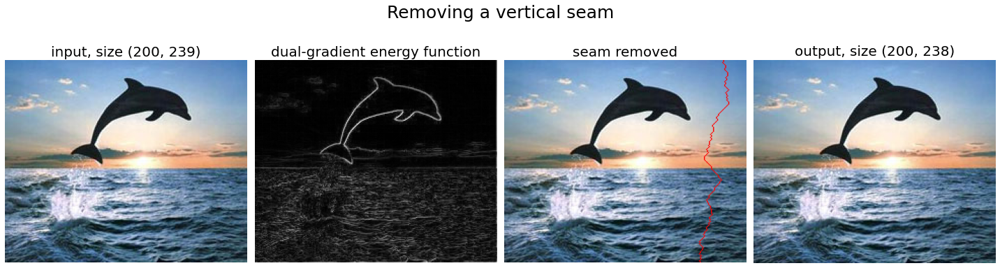

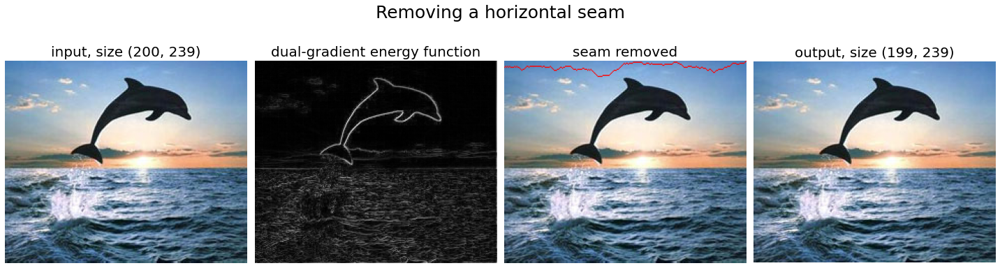

In [32]:
def remove_vertical_seam(m, n, I, vseam):	
    for (i,j) in vseam:
        I[i,j:n-1,:] = I[i,j+1:,:]
    return m, n-1, I[:m,:n-1,:]

def seam_carving_remove_vertical_seam(I):
    (m,n,d) = I.shape
    E = compute_energy(m, n, d, I)
    vseam = vertical_seam_carve(m, n, E)
    m, n, I_out = remove_vertical_seam(m, n, I, vseam)
    return I_out, E, vseam

def remove_horizontal_seam(m, n, I, hseam):	
    for (i,j) in hseam:
        I[i:m-1,j,:] = I[i+1:,j,:]
    return m-1, n, I[:m-1,:n,:]

def seam_carving_remove_horizontal_seam(I):
    (m,n,d) = I.shape
    E = compute_energy(m, n, d, I)
    hseam = horizontal_seam_carve(m, n, E)
    m, n, I_out = remove_horizontal_seam(m, n, I, hseam)
    return I_out, E, hseam

def plot_energy_seam_removed(E, I, I_out, seam, title):
    I = I.copy()
    plt.figure(figsize=(20,6))
    plt.subplot(141), plt.imshow(I), plt.axis('off'), plt.title('input, size {}'.format(I.shape[:2]), size=20)
    plt.subplot(142), plt.imshow(E, cmap='gray'); plt.axis('off'), plt.title('dual-gradient energy function', size=20)
    for (i,j) in seam:
        I[i,j,:] = np.array([1,0,0])
    plt.subplot(143), plt.imshow(I), plt.axis('off'), plt.title('seam removed', size=20)
    plt.subplot(144), plt.imshow(I_out), plt.axis('off'), plt.title('output, size {}'.format(I_out.shape[:2]), size=20)
    plt.suptitle(title, size=25)
    plt.tight_layout()
    plt.show()    

#'vr.jpg' #'house.png' # #'temple.jpg' #'cycle.png' #'bird2.png' #'dolphin.jpg' #'man.png' # 'shoes.jpg' #'Fuji.jpg' # # # # #'sea2.png' # # # #'HJoceanSmall.png'
im = mpimg.imread('images/dolphin.jpg').astype(np.float) / 255 # * 255 # / 255
im_out, E, vseam = seam_carving_remove_vertical_seam(im)
plot_energy_seam_removed(E, im, im_out, vseam, 'Removing a vertical seam')
im_out, E, hseam = seam_carving_remove_horizontal_seam(im)
plot_energy_seam_removed(E, im, im_out, hseam, 'Removing a horizontal seam')
#maskfile = 'seamask.jpg' #'manmask.png' #'shoemask.jpg'
#SeamCarving(imfile, maskfile)
#SeamCarving1(imfile)

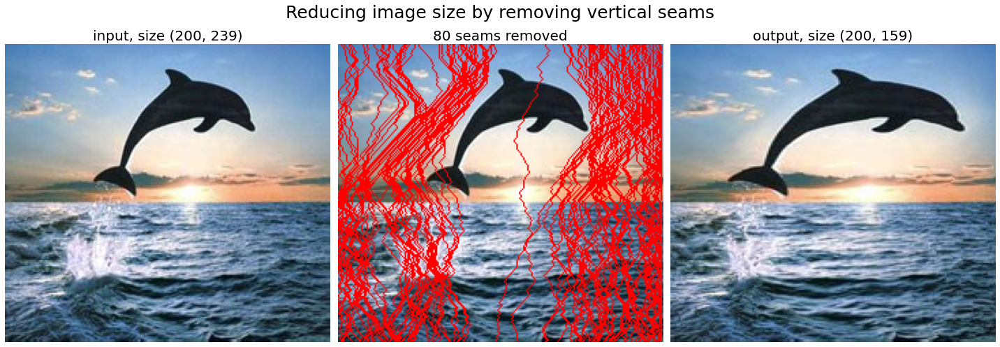

In [33]:
def seam_carve_remove_seams(I, k):
    I = I.copy()
    m, n = I.shape[:2]
    vseams = []
    i = 0
    while i < k:
        I, E, vseam = seam_carving_remove_vertical_seam(I)
        vseams.append(vseam)
        i += 1
    return I, vseams

def plot_vertical_seams_removed(I, I_out, vseams, title):
    n = I_out.shape[1]
    I1 = np.zeros_like(I)    
    I1[:, :n] = I_out
    for vseam in vseams[::-1]:
        for (i, j) in vseam:
            I1[i,j+1:,:] = I1[i,j:-1,:]
            I1[i,j,:] = np.array([1,0,0])
        #n += 1
    plt.figure(figsize=(20,7))
    plt.subplot(131), plt.imshow(I, aspect='auto'), plt.axis('off'), plt.title('input, size {}'.format(I.shape[:2]), size=20)
    plt.subplot(132), plt.imshow(I1, aspect='auto'), plt.axis('off'), plt.title('{} seams removed'.format(len(vseams)), size=20)
    plt.subplot(133), plt.imshow(I_out, aspect='auto'), plt.axis('off'), plt.title('output, size {}'.format(I_out.shape[:2]), size=20)
    plt.suptitle(title, size=25)
    plt.tight_layout()
    plt.show()    

im_out, vseams = seam_carve_remove_seams(im, 80)
plot_vertical_seams_removed(im, im_out, vseams, 'Reducing image size by removing vertical seams')

### **Object Removal via Seam Carving**

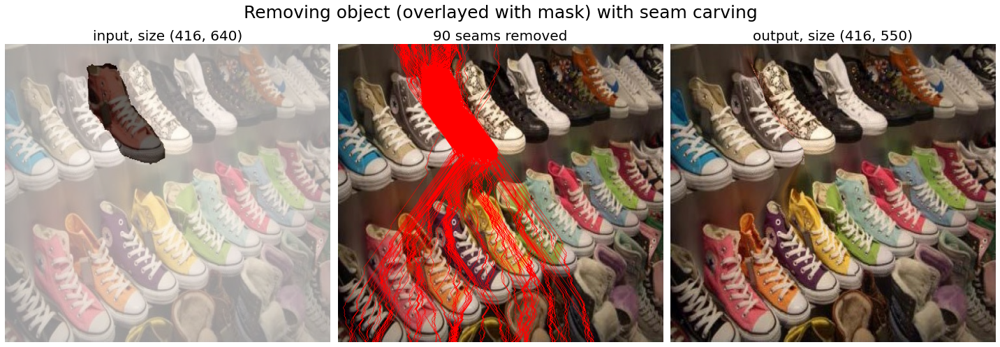

In [279]:
def seam_carving_remove_vertical_seam_with_mask(I, M):
    (m,n,d) = I.shape
    E = compute_energy(m, n, d, I)
    E *= M[:,:,0]
    vseam = vertical_seam_carve(m, n, E)
    _, _, I_out = remove_vertical_seam(m, n, I, vseam)
    m, n, M = remove_vertical_seam(m, n, M, vseam)
    return I_out, M, vseam

def seam_carve_remove_seams_with_mask(I, M, k):
    I = I.copy()
    M = M.copy()
    M[M == 0] = -1 * 255
    vseams = []
    i = 0
    while i < k:
        I, M, vseam = seam_carving_remove_vertical_seam_with_mask(I, M)
        vseams.append(vseam)
        i += 1
    return I, vseams

im, mask = mpimg.imread('images/shoes.jpg')[...,:3], mpimg.imread('images/shoemask.jpg')[...,:3]
im, mask = im / im.max(), mask / mask.max()
im_out, vseams = seam_carve_remove_seams_with_mask(im, mask, 90)
plot_vertical_seams_removed(0.4*im + 0.6*mask, im_out, vseams, 'Removing object (overlayed with mask) with seam carving')

### **Object Protection and Selective Removal**

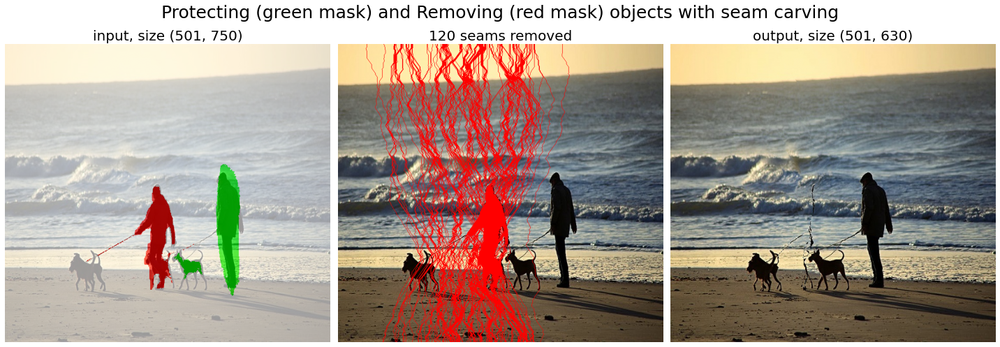

In [284]:
def seam_carve_protect_and_remove_seams_with_mask(I, M, k):
    I1, M1 = I, M
    I = I.copy()
    M = M.copy()
    #M[M == 0] = -1 * 255
    M[(M[...,0]==1) & (M[...,1]==0) & (M[...,2]==0)] = -99999 #-1*255
    M[(M[...,0]==0) & (M[...,1]==1) & (M[...,2]==0)] = 10**9 #1*255
    vseams = []
    i = 0
    while i < k:
        I, M, vseam = seam_carving_remove_vertical_seam_with_mask(I, M)
        vseams.append(vseam)
        i += 1
    return I, vseams

im, mask = mpimg.imread('images/man_dog.jpeg')[...,:3], mpimg.imread('images/man_dog_mask.jpg')[...,:3]
im, mask = im / im.max(), mask / mask.max()
mask2 = np.ones_like(mask)
mask2[(mask[...,0]>0.95) & (mask[...,1]<0.05) & (mask[...,2]<0.05)] = [1,0,0]
mask2[(mask[...,0]<0.05) & (mask[...,1]>0.95) & (mask[...,2]<0.05)] = [0,1,0]    
im_out, vseams = seam_carve_protect_and_remove_seams_with_mask(im, mask2, 120)
plot_vertical_seams_removed(0.4*im + 0.6*mask2, im_out, vseams, 'Protecting (green mask) and Removing (red mask) objects with seam carving')

## **6.2 Texture Synthesis and Transfer with Image Quilting**
### **6.2.1 Patch-Based Texture Synthesis with Image Quilting**

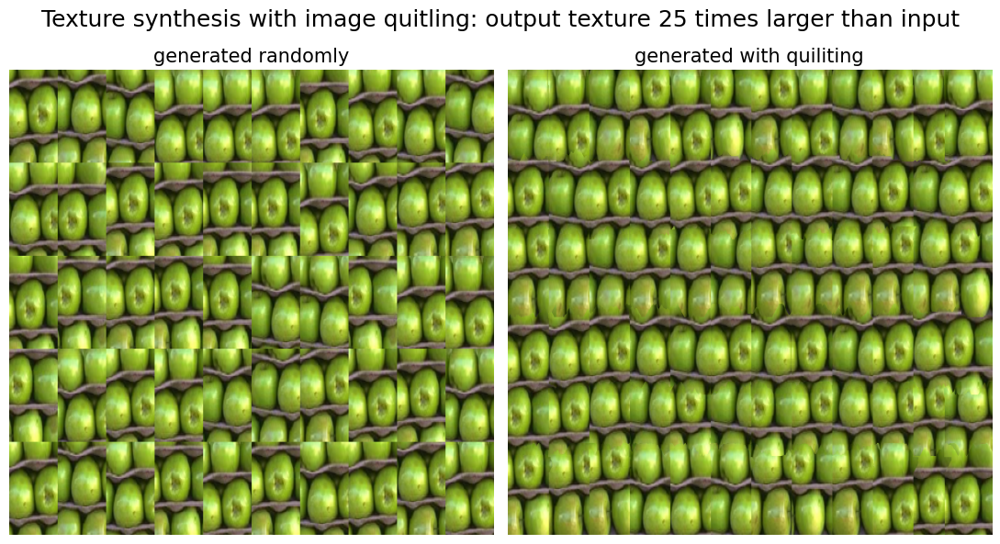

In [51]:
#https://www.youtube.com/watch?v=O6E17BXIln4
from numpy.random import randint, choice
import matplotlib.image as mpimg
import cv2
import numpy as np
import matplotlib.pylab as plt

def gen_rand_sample_block(I, B):
    (m, n, d) = I.shape
    i, j = randint(0, m - B), randint(0, n - B)
    return I[i:i+B,j:j+B,:]

def gen_samples(I, B, N):
    (m, n, d) = I.shape
    k = int(np.sqrt(N))
    samples = []
    i = 0
    while i <= m - B:
        j = 0
        while j <= n - B:
            samples.append(I[i:i+B,j:j+B,:])
            j += (n-B) // k
        i += (m-B) // k
    return samples

def ssd_patch(quilt_gen, sample, i, j, B, o):
    if i == 0 and j == 0:
        return 0
    else:
        ssd = 0
        if i > 0: # This evaluates mismatch along the top overlap
            ssd += np.sum((quilt_gen[i:i+o,j:j+B,:] - sample[:o,:B,:])**2)
        if j > 0: # This evaluates mismatch along the left overlap
            ssd += np.sum((quilt_gen[i:i+B,j:j+o,:] - sample[:B,:o,:])**2)
    return ssd

def min_cut(p1, p2):
    (m, o, _) = p1.shape
    e = np.sum((p1 - p2)**2, axis=2)
    inf = float('Inf')
    E = np.zeros((m,o))	
    j = 0
    for i in range(m):
        E[i,j] = e[i,j] 
    i = 0
    for j in range(o):
        E[i,j] = e[i,j] 
    for i in range(1,m):
        for j in range(1,o):
            E[i,j] = min([(E[i-1,j-1] if j > 1 else inf),E[i-1,j],(E[i-1,j+1] if j < o-1 else inf)]) + e[i,j]
    i = m - 1		
    _, minj = min([(E[i,j],j) for j in range(1,o)])
    indices = [minj]
    while i > 0:
        if minj > 1 and E[i-1,minj-1] + e[i,minj] == E[i,minj]:
            minj -= 1
        elif minj < o-1 and E[i-1,minj+1] + e[i,minj] == E[i,minj]:
            minj += 1
        indices = [minj] + indices
        i -= 1
    return indices

def quilt(imfile, B, K=5, k=0.1, ns=100):
    I = mpimg.imread(imfile)[...,:3] 
    I = I / I.max()
    samples = gen_samples(I, B, ns)
    o = B//6 
    (m, n, d) = I.shape
    M, N = (m//B)*B*K, (n//B)*B*K
    rand_gen = np.zeros((M, N, d))
    for i in range(0, M, B):
        for j in range(0, N, B):
            rand_gen[i:i+B, :][:,j:j+B] = samples[np.random.choice(ns, 1)[0]] 
    quilt_gen = np.ones((M, N, d))*np.nan
    for i in list(range(0, M - B, B - o)) + [M - B]:
        for j in list(range(0, N - B, B - o)) + [N - B]:
            if quilt_gen[i:i+B,j:j+B,:].shape == samples[0].shape:
                ds = [ssd_patch(quilt_gen, sample, i, j, B, o) for sample in samples]
                minindex = np.argmin(ds)
                mind = ds[minindex] 
                patches = [samples[minindex]]
                for ix in range(len(ds)):
                    if abs(ds[ix] - mind) < k*mind and ds[ix] != mind:
                        patches.append(samples[ix])
                index = np.random.choice(range(len(patches)), 1)[0]
                sample = patches[index]
                if j > 0:
                    jmins = min_cut(quilt_gen[i+o:i+B,j+B-o:j+B,:],sample[o:,B-o:B,:])
                    ix = o
                    for jmin in jmins:
                        quilt_gen[i+ix,j+jmin:j+B,:] = sample[ix,jmin:B,:] 
                        ix += 1
                else:
                    quilt_gen[i+o:i+B,j:j+B,:] = sample[o:B,:B,:] 
                if i > 0:
                    imins = min_cut(np.transpose(quilt_gen[i:i+o,j:j+B,:],(1,0,2)),np.transpose(sample[:o,:B,:], (1,0,2)))
                    jx = 0
                    for imin in imins:
                        quilt_gen[i+imin:i+o,j+jx,:] = sample[imin:o,jx,:] 
                        jx += 1	
                else:
                    quilt_gen[i:i+o,j:j+B,:] = sample[:o,:B,:] 	
                #quilt_gen[i:i+B,j:j+B,:] = sample 
            else:
                quilt_gen[i:i+B,j:j+B,:] = np.nan
    quilt_gen = quilt_gen[:M,:N]
    return rand_gen, quilt_gen

imfile = 'images/fruits.png' 
#imfile = 'images/texture.jpg' 
K, B = 5, 85 # resize image 5*5 times
rand_gen, quilt_gen = quilt(imfile, B, K=K, k=0.1)
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(rand_gen, aspect='auto'), plt.axis('off'), plt.title('generated randomly', size=15)
plt.subplot(122), plt.imshow(quilt_gen, aspect='auto'), plt.axis('off'), plt.title('generated with quiliting', size=15)
plt.suptitle(f'Texture synthesis with image quitling: output texture {K**2} times larger than input', size=18)
plt.tight_layout()
plt.show()

### **6.2.2 Texture Transfer**

In [ ]:
def texture_transfer(imfile, imfile2, B, k=0.1, lambda1=0.5, ns=625, show_boundary=False):
    I, It = mpimg.imread(imfile), mpimg.imread(imfile2)
    I, It = I / I.max(), It / It.max()
    samples = gen_samples(I, B, ns)
    o = B // 6 
    (m, n, d) = I.shape
    (M, N, _) = It.shape
    out = np.zeros((M, N, d))
    for i in list(range(0, M - B, B - o)) + [M - B]:
        for j in list(range(0, N - B, B - o)) + [N - B]:
             if out[i:i+B,j:j+B,:].shape == samples[0].shape:
                ds = [lambda1*ssd_patch(out, I2, i, j, B, o) + (1-lambda1)*np.sum((I2 - It[i:i+B,j:j+B,:])**2) for I2 in samples]
                minindex = np.argmin(ds)
                mind = ds[minindex] 
                patches = [samples[minindex]]
                for ix in range(len(ds)):
                    if abs(ds[ix] - mind) < k*mind and ds[ix] != mind:
                        patches.append(samples[ix])
                # choose one randomly
                index = np.random.choice(range(len(patches)), 1)[0]
                I2 = patches[index]
                if j > 0:
                    jmins = min_cut(out[i+o:i+B,j+B-o:j+B,:],I2[o:,B-o:B,:])
                    ix = o
                    for jmin in jmins:
                        out[i+ix,j+jmin:j+B,:] = I2[ix,jmin:B,:] 
                        ix += 1
                else:
                    out[i+o:i+B,j:j+B,:] = I2[o:B,:B,:] 
                if i > 0:		
                    imins = min_cut(np.transpose(out[i:i+o,j:j+B,:],(1,0,2)),np.transpose(I2[:o,:B,:], (1,0,2)))
                    jx = 0
                    for imin in imins:
                        out[i+imin:i+o,j+jx,:] = I2[imin:o,jx,:] 
                        jx += 1	
                else:
                    out[i:i+o,j:j+B,:] = I2[:o,:B,:] 
             else:
                out[i:i+B,j:j+B,:] = 0 
        
    return I, It, out[:M, :N] #out[:i-(B-o),:j-(B-o)]

imfile = 'images/epii.png'
imfile2 = 'images/me.png'
B = 20
im_text, im_target, im_out = texture_transfer(imfile, imfile2, B, k=0.1, lambda1=0.5)

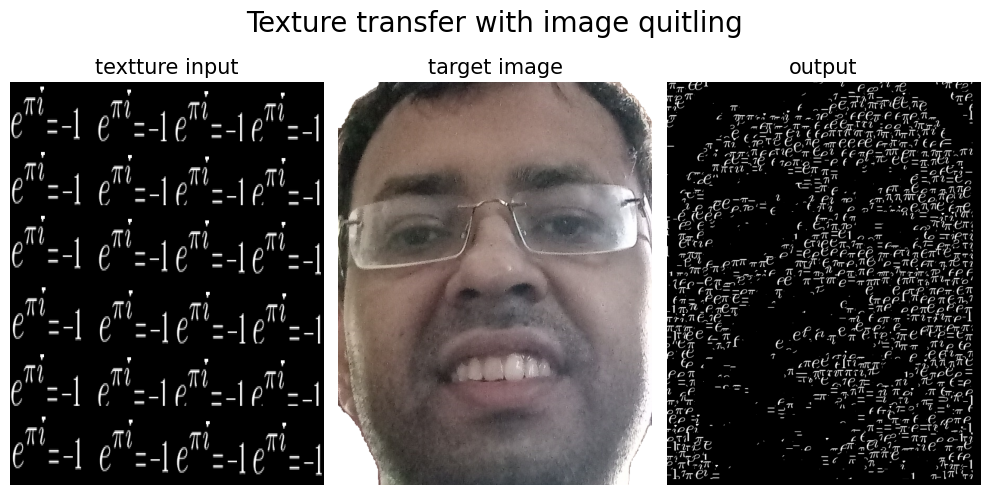

In [30]:
plt.figure(figsize=(10,5))
plt.subplot(131), plt.imshow(im_text, aspect='auto'), plt.axis('off'), plt.title('textture input', size=15)
plt.subplot(132), plt.imshow(im_target, aspect='auto'), plt.axis('off'), plt.title('target image', size=15)
plt.subplot(133), plt.imshow(im_out, aspect='auto'), plt.axis('off'), plt.title('output', size=15)
plt.suptitle(f'Texture transfer with image quitling', size=20)
plt.tight_layout()
plt.show()

## **7. Graph-Based Optimization Methods**
### **7.1 Interactive Image Segmentation with Graph Cut**

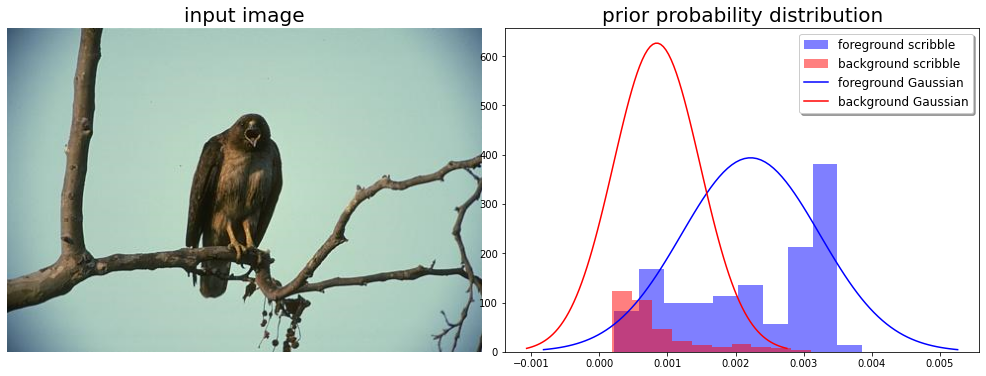

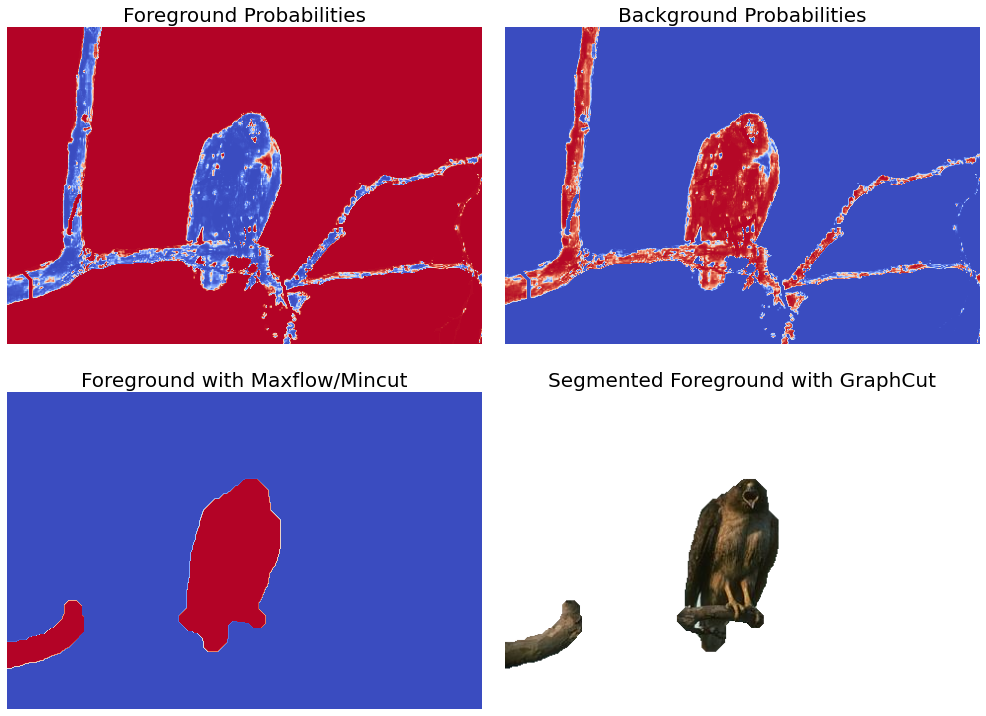

In [27]:
import numpy as np
import maxflow
from copy import deepcopy
from graphviz import Digraph
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import defaultdict
import scipy
from scipy.stats import norm
from skimage.transform import resize

def plot_dist(img, comps, µ, Σ):
    k0, k1 = comps.keys()
    fi, bi = comps[k0][:,0], comps[k1][:,0]
    plt.figure(figsize=(15,5))
    plt.subplots_adjust(0.05, 0.05, 0.95, 0.95, 0.05, 0.05)
    plt.subplot(121), plt.imshow(img, aspect='auto'), plt.axis('off'), plt.title('input image', size=20)
    plt.subplot(122)
    plt.hist(fi, color='blue', lambda=0.5, label='foreground scribble')
    plt.hist(bi, color='red', lambda=0.5, label='background scribble')
    µ1, σ =  µ[k0][0], np.sqrt(Σ[k0][0,0])
    x = np.linspace(-3 * σ + µ1, 3 * σ + µ1, 100)
    plt.plot(x, norm.pdf(x, µ1, σ), color='blue', label='foreground Gaussian')
    µ1, σ =  µ[k1][0], np.sqrt(Σ[k1][0,0])
    x = np.linspace(-3 * σ + µ1, 3 * σ + µ1, 100)
    plt.plot(x, norm.pdf(x, µ1, σ), color='red', label='background Gaussian')
    plt.legend(fontsize=12, title_fontsize=15, shadow=True)
    plt.title('prior probability distribution', size=20)
    plt.show()
    
def plot_fg_bg(πs, img, rgb, comps):
    fig = plt.figure(figsize=(15,11))
    plt.subplots_adjust(0.05, 0.05, 0.95, 0.95, 0.05, 0.05)
    i = 0
    for c in comps:
        plt.subplot(2,2,i+1)
        plt.imshow((255*πs[c]).astype(int), cmap='coolwarm')
        plt.title(('Foreground' if i == 0 else 'Background') + ' Probabilities', size=20)
        plt.axis('off')
        i += 1
    plt.subplot(2,2,3)
    plt.imshow((255*img).astype(int), cmap='coolwarm'), plt.axis('off')
    plt.title('Foreground with Maxflow/Mincut', size=20)
    plt.subplot(2,2,4)
    plt.imshow(rgb), plt.axis('off')
    plt.title('Segmented Foreground with GraphCut', size=20)    
    plt.show()
    
def plot_graph(sgm, edges, w, h):
    src, snk = w*h, w*h+1
    fg, bg = np.where(sgm==False), np.where(sgm==True)
    num = 25 #50 #100
    fgnodes = set([])
    x, y = fg[0].tolist(), fg[1].tolist()
    for i in range(num): 
        fgnodes.add(ij2id(x[i],y[i],w,h))
    bgnodes = set([])
    x = np.array(x)
    x1, y1 = bg[0].tolist(), bg[1].tolist()
    
    k = 0
    for i in range(len(x1)): 
        indices = np.where(x == x1[i])[0]
        for j in indices:
            if abs(y1[i]-y[j]) <= 1 and y1[i] > 0 and y1[i] < h-1 and y[j] > 0 and y[j] < h-1:
                bgnodes.add(ij2id(x1[i],y1[i],w,h))
                k += 1
                if k == num:
                    break
        if k == num:
            break
    nodes = fgnodes.union(bgnodes)
    nodes.add(src)
    nodes.add(snk)
    
    s = Digraph('flow_' + imfile, format='png')
    s.attr('node', shape='doublecircle')
    s.node(str(src))
    s.node(str(snk))
    s.attr('node', shape='circle', style='filled', color='blue') #'black')
    for n in fgnodes:
        s.node(str(n))
    s.attr('node', shape='circle', style='filled', color='red') #'white')
    for n in bgnodes:
        s.node(str(n))
    for e in edges:
        if int(e[0]) in nodes and int(e[1]) in nodes:
            s.edge(e[0], e[1])	
    s.render('images/flow_graph.png', view=False)

def ij2id(i, j, w, h):
    return h*i + j

def rgb2yiq(rgb):
    rgb = rgb / 255.0
    y = np.clip(np.dot(rgb, np.array([0.299, 0.587, 0.144])),             0,   1)
    i = np.clip(np.dot(rgb, np.array([0.595716, -0.274453, -0.321263])), -0.5957, 0.5957)
    q = np.clip(np.dot(rgb, np.array([0.211456, -0.522591, 0.311135])),  -0.5226, 0.5226)
    yiq = rgb
    yiq[..., 0] = y
    yiq[..., 1] = i
    yiq[..., 2] = q
    return yiq

def find_marked_locations(bw, marked):
    diff = marked - bw
    colored = [set(zip(*np.nonzero(diff[:, :, i]))) for i in [1, 2]]
    return colored[0].union(colored[1])

def compute_pdfs(yuv, rgb_scribe, scribbles):
    '''
    # Compute foreground and background pdfs
    # input image and the image with user scribbles
    '''
    imageo = np.zeros(yuv.shape)
    comps = defaultdict(lambda:np.array([]).reshape(0,3))
    for (i, j) in scribbles: 
        imageo[i,j,:] = rgb_scribe[i,j,:] #yuv_scribe[i,j,:]  # comp scribe color as key of comps
        comps[tuple(imageo[i,j,:])] = np.vstack([comps[tuple(imageo[i,j,:])], yuv[i,j,:]])
    µ, Σ = {}, {}
    for c in comps:
        µ[c] = np.mean(comps[c], axis=0) #[0]
        Σ[c] = np.cov(comps[c].T) #[0,0]    

    return µ, Σ, comps

def segment_graph_cut(imfile, imfile_scribe, σ=1):

    rgb = mpimg.imread(imfile)[:,:,:3]
    yuv = rgb2yiq(rgb)
    rgb_scribe = mpimg.imread(imfile_scribe)[:,:,:3]
    yuv_scribe = rgb2yiq(rgb_scribe)
    scribbles = find_marked_locations(rgb, rgb_scribe) #(yuv, yuv_scribe)
    
    µ, Σ, comps = compute_pdfs(yuv, rgb_scribe, scribbles)

    (w, h) = yuv.shape[:2]
    src, snk = w*h, w*h+1
    # Create the graph.
    g = maxflow.GraphFloat() #FlowGraph(vertex_count)
    # Add the nodes. nodeids has the identifiers of the nodes in the grid.
    nodeids = g.add_grid_nodes((w, h))
    
    πs = defaultdict(lambda:np.zeros(yuv.shape[:2]))
    k0, k1 = comps.keys()
    edges = set([])
    for i in range(yuv.shape[0]):
        for j in range(yuv.shape[1]):
            Z = 0.
            for c in comps:
                if np.sum(Σ[c]) == 0:
                    πs[c][i,j] = 1. if all(yuv[i,j,:] == µ[c]) else 0.
                else:
                    πs[c][i,j] = np.exp(-np.dot((yuv[i,j,:] - µ[c]), scipy.linalg.solve(Σ[c], (yuv[i,j,:] - µ[c])))) / np.sqrt(np.linalg.det(2*np.pi*Σ[c]))
                Z += πs[c][i,j]
            if Z > 0:
                for c in comps:
                    πs[c][i,j] /= Z 
            if (i, j) in scribbles:
                πs[k0][i,j], πs[k1][i,j] = 1., 0.
                if tuple(rgb_scribe[i,j,:]) == k1:
                    πs[k0][i,j], πs[k1][i,j] = 0., 1.
            nid = ij2id(i,j,w,h)
            g.add_tedge(nid, πs[k0][i,j], πs[k1][i,j]) #capacity
            edges.add((str(src), str(nid)))
            edges.add((str(nid), str(snk)))
            for i1 in range(i-1, i+2):
                for j1 in range(j-1, j+2):
                    if i1 == i and j1 == j:
                        continue
                    if i1 >= 0 and i1 < w and j1 >= 0 and j1 < h:
                        wt = np.exp(-(yuv[i,j,0]-yuv[i1,j1,0])**2 / (2*σ**2)) 
                        n1, n2 = ij2id(i,j,w,h), ij2id(i1,j1,w,h)
                        g.add_edge(n1, n2, wt, wt) #capacity		
                        edges.add((str(n1), str(n2)))
                        edges.add((str(n2), str(n1)))


    plot_dist(rgb, comps, µ, Σ)

    # Find the maxiµm flow.
    g.maxflow()
    # Get the segments of the nodes in the grid.
    sgm = g.get_grid_segments(nodeids)	
    img_seg = np.int_(sgm) #np.logical_not(sgm))

    idx = (img_seg==0)
    rgb_seg = deepcopy(rgb)
    rgb_seg[idx] = 1. #255 #1.
    
    plot_fg_bg(πs, img_seg, rgb_seg, comps)
    
    plot_graph(sgm, edges, w, h)

    return rgb, img_seg

# https://www.youtube.com/watch?v=HMGX8HXskKk
# https://www.youtube.com/watch?v=A4OQyhY0g5I	
# https://www.youtube.com/watch?v=lYQQ88nzxAM
#https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300/html/dataset/images.html	
imfile = 'images/eagle.png' #'frog.png' # #'eagle.png' #'fish2.png' #'cheetah.png' #'liver.png' # #'fishes2.png' #'deer.png' #'rose.png' #'bunny.png' #'bell.png' #'whale.png' # #'umbc_campus.png' # #'input2.png' #'tiger.png' #'flowers.png' #'bell.png' #'panda.png' #'horses.png' #'input1.png' #'zebra.png' # # #  ### #'liver.bmp' #'eagle.png'  # #'tiger.png' #'bunny.bmp' # #'flowers.png' ##'rose.bmp' # #'zebra.png' #'man.png' # # #'bisons.png' # #'liver.png' #'cat1.png' # # #'cat1.png' #
imfile_scribe = 'images/eagle_scribed.png'#'frog_scribed.png' # #'eagle_scribed.png' #'fish2_scribed.png' #'cheetah_scribed.png' #'liver_scribed.png' # #'fishes2_scribed.png'  #'deer_scribed.png' #'rose_scribed.png' #'bunny_scribed.png' #'bell_scribed.png' #'whale_scribed.png' # #'umbc_campus_scribed.png' # #'input2_scribed.png' #'tiger_scribed.png' #'flowers_scribed.png' #'bell_scribed.png' #'panda_scribed.png' #'horses_scribed.png' #'input1_scribed.png' #'zebra_scribed.png' # # # # # ##'liver_scribed.bmp' #'eagle_scribed.png' # #'tiger_scribed.png' #'bunny_scribed.bmp' # #'flowers_scribed.png' ##'rose_scribed.bmp' # #'zebra_scribed.png' #'man_scribed.png' # # #'bisons_scribed.png' # #'liver_scribed.png' #'cat1_scribed.png' # #'input2_scribed.png' #'flowers_scribed.png' #
orig_image, seg_out = segment_graph_cut(imfile, imfile_scribe, 0.01)

### **Replacing the Background of an Image**

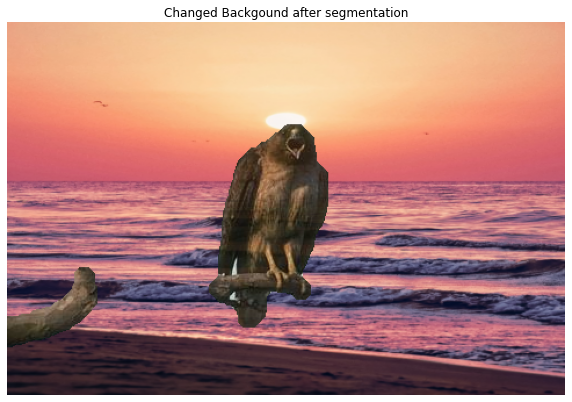

In [34]:
def change_bg(seg_out, orig_image, new_image):
    assert orig_image.shape == new_image.shape
    idx=(seg_out==1)
    output = deepcopy(new_image)
    lambda = 0.9
    output[idx] = (1-lambda)*new_image[idx] + lambda*orig_image[idx]
    plt.figure(figsize=(10,10))
    plt.imshow(output) #rgb*np.array([img2,img2,img2]).T)
    plt.title('Changed Backgound after segmentation')
    plt.axis('off')
    plt.show()

change_bg(seg_out, orig_image, new_image=resize(mpimg.imread('images/sea.jpeg')[:,:,:3], orig_image.shape))

## **7.2 Graph-Based Image Segmentation: The Felzenszwalb–Huttenlocher Algorithm**

In [64]:
from scipy import signal 
from graphviz import Graph

def gaussian_kernel(k, s = 0.5):
    # generate a (2k+1)x(2k+1) gaussian kernel with mean=0 and sigma = s
    probs = [np.exp(-z*z/(2*s*s))/np.sqrt(2*np.pi*s*s) for z in range(-k,k+1)] 
    return np.outer(probs, probs)

def min_int(C1, C2, M, S, k):
    return min(M[C1]+k/S[C1],M[C2]+k/S[C2])

#s.attr('node', shape='doublecircle')
#s.node(str(src))
#s.node(str(snk))
#s.attr('node', shape='circle', style='filled', color='blue') #'black')
#s.node(str(n))
#s.attr('node', shape='circle', style='filled', color='red') #'white')

def seg_graph(imfile, k=1., sigma=0.8, sz=1):
    #iter = 50000 #25000 #50000
    rgb = mpimg.imread(imfile)[:,:,:3]
    gauss_kernel = 	gaussian_kernel(sz, sigma)
    for i in range(3):
        rgb[:,:,i] = signal.convolve2d(rgb[:,:,i], gauss_kernel, boundary='symm', mode='same')
    yuv = rgb2yiq(rgb)
    (w, h) = yuv.shape[:2]
    s = Graph('mst', format='png')
    s.node_attr.update(color='lightblue2', style='filled')
    edges = {}
    nodes = set([])
    for i in range(yuv.shape[0]):
        for j in range(yuv.shape[1]):
            choose = np.random.rand() >= 0.75
            for i1 in range(i-1, i+2):
                for j1 in range(j-1, j+2):
                    if i1 == i and j1 == j:
                        continue
                    if i1 >= 0 and i1 < w and j1 >= 0 and j1 < h:
                        wt = np.abs(yuv[i,j,0]-yuv[i1,j1,0]) #1 - np.exp(-(yuv[i,j,0]-yuv[i1,j1,0])**2 / (2*sigma**2)) 
                        n1, n2 = ij2id(i,j,w,h), ij2id(i1,j1,w,h)
                        edges[n1, n2] = edges[n2, n1] = wt		
                        if len(nodes) < 100 and choose: #and wt > 0:
                            s.edge(str(n1), str(n2), label=str(round(wt*10**3,2)))
                            nodes.add(n1)
                            nodes.add(n2)
    W = sorted([(edges[n1,n2], n1, n2) for (n1, n2) in edges])
    C = {n:n for n in range(w*h)}
    M = {n:0. for n in range(w*h)}
    S = {n:1. for n in range(w*h)}
    comps = {n:[n] for n in range(w*h)}
    out = rgb
    count = 0
    for (wt, n1, n2) in W:
        C1, C2 = C[n1], C[n2] # id1, id2
        if C1 != C2:
            if wt < min_int(C1, C2, M, S, k):
                if n1 in nodes and n2 in nodes:
                    s.edge(str(n1), str(n2), color='red', weight='2', label=str(round(wt*10**3,2)))
                comps[C1] += comps[C2]
                for n in comps[C2]:
                    C[n] = C[n1]
                M[C1] = max([M[C1], M[C2], wt])
                S[C1] = S[C1] + S[C2]
                del comps[C2]		
                del M[C2]
                del S[C2]

    M1 = {}
    for key in comps.keys():
        M1[key] = np.mean(np.array([rgb[n//h, n%h, :] for n in comps[key]]), axis=0)
    out = np.zeros((w, h, 3))
    for n in range(w*h):
        x, y = n // h, n % h
        #out[x, y, :] = M[C[n]]
        out[x, y] = M1[C[n]] #np.mean(M1[C[n]])

    s.render('mst', view=False)
    
    return rgb, out, comps

k = .001  #.0005 #.001 #.01 #1.
imfile = 'images/hand.png' # 'hand.png' # 'building.png' # #'people.png' # #'hill.png' #'road.png' #'umbc.png' #'parrot.png' 'player.png' 
im_in, im_out, comp = seg_graph(imfile, k)

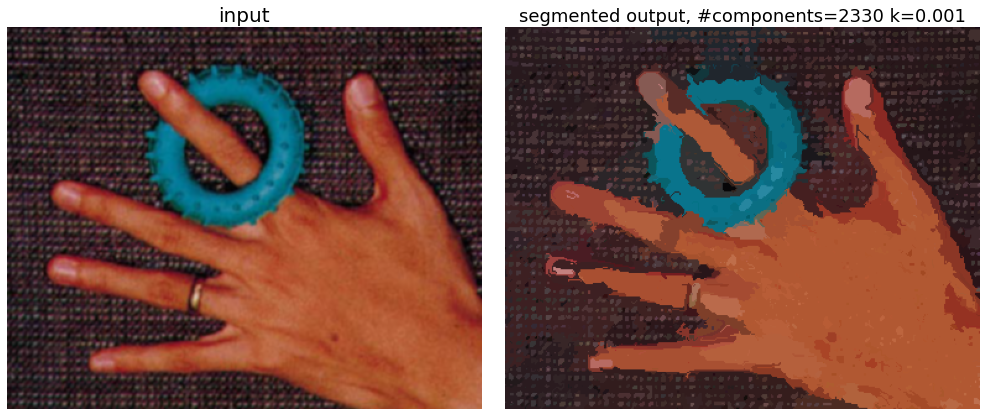

In [65]:
plt.figure(figsize=(15,7))
plt.subplots_adjust(0.05, 0.05, 0.95, 0.95, 0.05, 0.05)
plt.subplot(121), plt.imshow(im_in), plt.axis('off'), plt.title('input', size=20)
plt.subplot(122), plt.imshow(im_out) #, cmap=plt.cm.Set1) #Set1 #viridis #inferno #RdYlBu #hot #terrain) #Dark2)#spectral) #rainbow)
plt.axis('off'), plt.title(f'segmented output, #components={len(comp.keys())} k={round(k,3)}', size=18)
plt.show()